 # On-Shelf Availability in Retailing:  Python Codes

### Downloading the required libraries and importing Yolo

In [ ]:
! pip install ultralytics

In [24]:
from ultralytics import YOLO

### Loading the Yolo(nano) version into the varibale "model"

In [9]:
#model = YOLO("yolov8n.pt")

### Training the model using the hyperparameter obtained
### <font color="#006400">**After training, a file named best.pt will be generated. We can use the best.pt file for further analysis. The best.pt file is shared with the codes.**</font>

In [20]:
#model.train(data='data.yaml',epochs=40,imgsz=640,batch=16,patience=10,optimizer='AdamW',lr0=0.001,momentum=0.97,seed=25,box=5.5,cls=0.5,dfl=2,label_smoothing=0.2)

New https://pypi.org/project/ultralytics/8.0.156 available  Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.155  Python-3.9.17 torch-2.0.1+cpu CPU (AMD Ryzen 7 5700U with Radeon Graphics)
engine\trainer: task=detect, mode=train, model=D:\Beinex Fnal project\project space detection\runs\detect\train25\weights\best.pt, data=data.yaml, epochs=40, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=25, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, lin

      23/40         0G      1.068      1.184      1.752         69        640: 100%|██████████| 14/14 [01:21<00:00,  5.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<0
                   all         60       1877      0.648      0.539      0.571      0.328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      24/40         0G       1.07      1.179      1.744         54        640: 100%|██████████| 14/14 [01:24<00:00,  6.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:13<0
                   all         60       1877      0.655      0.549       0.58      0.331

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
      25/40         0G      1.064      1.172      1.756         37        640: 100%|██████████| 14/14 [01:20<00:00,  5.
                 Class     Images  Instances      Box(P         

Model summary (fused): 168 layers, 3006038 parameters, 0 gradients
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:10<0
                   all         60       1877      0.633      0.546      0.579      0.337
                object         60       1118      0.646      0.644      0.651      0.417
                 space         60        759      0.619      0.448      0.507      0.257
Speed: 2.1ms preprocess, 110.5ms inference, 0.0ms loss, 50.5ms postprocess per image
Results saved to runs\detect\train26


### Loding the best.pt file into the variable "model"

In [25]:
model = YOLO(r"D:\Beinex Fnal project\project space detection\runs\detect\best.pt")
## replace the path with the best.pt file path

### Predicting the Test images using best.pt

In [77]:
results = model.predict(r"D:\Beinex Fnal project\project space detection\test\images",conf=0.33,iou=0.3,save=True,save_txt=True,save_conf=True)
## replace the path with the test folder file path


image 1/30 D:\Beinex Fnal project\project space detection\test\images\db117_jpg.rf.b344f2f39dbebe79b445e912f9db4134.jpg: 640x640 12 objects, 7 spaces, 131.5ms
image 2/30 D:\Beinex Fnal project\project space detection\test\images\db11_jpg.rf.fdb005a13afbd3dcd95b0dd789955fe5.jpg: 640x640 21 objects, 12 spaces, 130.0ms
image 3/30 D:\Beinex Fnal project\project space detection\test\images\db121_jpg.rf.3e2ceae886ea5916ae1563d2f7c78aa2.jpg: 640x640 18 objects, 5 spaces, 136.2ms
image 4/30 D:\Beinex Fnal project\project space detection\test\images\db134_jpg.rf.0261a4489381e6a62572aa33bef2cee3.jpg: 640x640 12 objects, 4 spaces, 128.1ms
image 5/30 D:\Beinex Fnal project\project space detection\test\images\db13_jpg.rf.7ea15c4f7e64bee2f90c1acca339223e.jpg: 640x640 21 objects, 3 spaces, 117.0ms
image 6/30 D:\Beinex Fnal project\project space detection\test\images\db148_jpg.rf.a629c143687446c5c2ff94087d4afd58.jpg: 640x640 19 objects, 11 spaces, 129.0ms
image 7/30 D:\Beinex Fnal project\project spa

### Visualizing all the predcited test images and showing the respective number

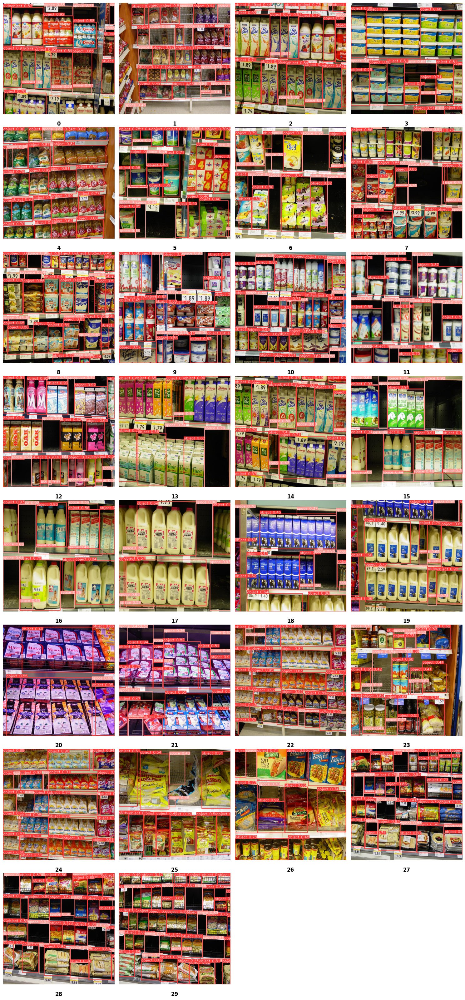

In [14]:
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

fontprops = fm.FontProperties(weight='bold', size=12)

num_images = len(results)
images_per_row = 4
num_rows = (num_images + images_per_row - 1) // images_per_row
fig, axes = plt.subplots(num_rows, images_per_row, figsize=(15, 4*num_rows))

for i, result in enumerate(results):
    row = i // images_per_row
    col = i % images_per_row

    image = result.plot()[:, :, ::-1]
    axes[row, col].imshow(image)
    axes[row, col].axis('off')
    axes[row, col].text(0.5, -0.1, str(i), transform=axes[row, col].transAxes,
                        ha='center', fontsize=12, fontproperties=fontprops, color='black')

for i in range(num_images, num_rows * images_per_row):
    row = i // images_per_row
    col = i % images_per_row
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

### Function for calculating the percentage of space in each shelves

In [32]:
def Calculate_Space(result):
    boxes = result.boxes

    class_0_annotations = []
    class_1_annotations = []

    for i in range(len(boxes.cls)):
        xmin, ymin, xmax, ymax = boxes.xyxy[i]
        class_label = int(boxes.cls[i])

        annotation = [xmin.item(), ymin.item(), xmax.item(), ymax.item()]

        if class_label == 0:
            class_0_annotations.append(annotation)
        elif class_label == 1:
            class_1_annotations.append(annotation)

    total_area_class_0 = sum((anno[2] - anno[0]) * (anno[3] - anno[1]) for anno in class_0_annotations)
    total_area_class_1 = sum((anno[2] - anno[0]) * (anno[3] - anno[1]) for anno in class_1_annotations)

    class_1_ratio = total_area_class_1 / (total_area_class_0 + total_area_class_1)
    class_1_ratio_percentage = class_1_ratio * 100

    return class_1_ratio_percentage

### Visualizing the predicted image and the space percentage
### <font color="#006400">**Run the code and provide an input number based on the predicted test images number above.**</font>

Enter the index of the result to visualize: 2


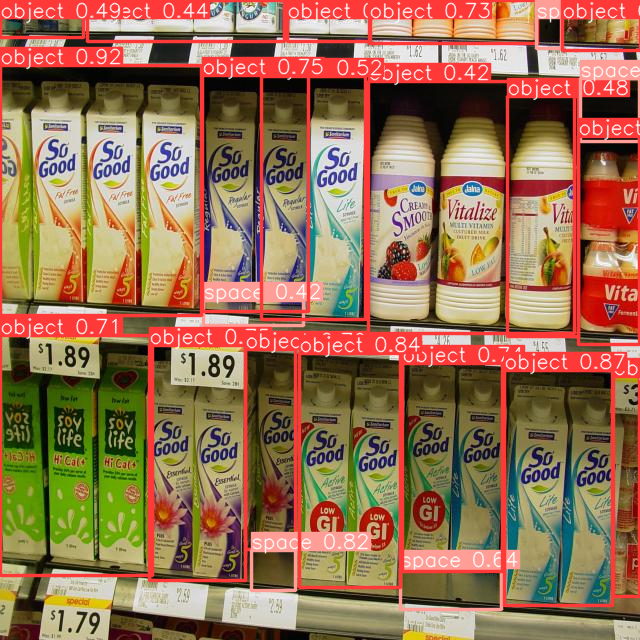

Percentage of space : 3.63%


In [78]:
from PIL import Image
from IPython.display import display

# Assuming 'results' is a list containing image data
index = int(input("Enter the index of the result to visualize: "))
result = results[index]

# Calculate the percentage of space occupied by class 1

# Load the image
image = Image.fromarray(result.plot()[:,:,::-1])
percentage_of_space = Calculate_Space(result)

# Display the image inline in the notebook
display(image)

# Display the percentage value
print(f"Percentage of space : {percentage_of_space:.2f}%")

## The codes below  are used for making tables for Dashboard building

### Predicting the space percentage in each test  image and making it into a table

In [62]:
## getting the names of the images from the folder into a list
import os
def get_image_names(folder_path, extensions=['.jpg', '.png', '.jpeg']):
    image_names = []
    for file_name in os.listdir(folder_path):
        if any(file_name.lower().endswith(ext) for ext in extensions):
            image_names.append(file_name)
    return image_names
## replace the path with the test folder file path
folder_path = r"D:\Beinex Fnal project\project space detection\test\images"

image_names = get_image_names(folder_path) 


In [63]:
## finding the percentage for each image
space=[]
for j in range(len(results)):
    result=results[j]
    space.append(Calculate_Space(result))

In [64]:
## combine the the columns of image_name and space
import pandas as pd
data = {'image_name': image_names, 'Vacancy_Percentage': space}
df = pd.DataFrame(data)


In [65]:
## saving the file 
df.to_csv('percentage_test.csv', index=False)

### Calculating the occupancy percenatge  in shelves by substracting space percenatage from total

In [66]:
df['Occupancy_Percentage']=100-df['Vacancy_Percentage']

### Labelling the vacancy percenatge according to below Criteria

**Urgent Fill Required (Empty space > 20%)  Indicating an immediate need for restocking**

**Needs Attention(Empty space > 10% and <= 20%) Suggesting that restocking should be considered soon**

**Managed Inventory(Empty space <= 10%) while the shelf is adequately stocked at the moment, there's still a need to keep an eye on it**


In [69]:
def categorize_shelf(Vacancy_Percentage):
    if Vacancy_Percentage > 20:
        return 'Urgent Fill Required'
    elif Vacancy_Percentage > 10:
        return 'Needs Attention'
    else:
        return 'Managed Inventory'

df['Category'] = df['Vacancy_Percentage'].apply(categorize_shelf)

### Cleaning image name and Displaying final table

In [76]:
df['image_name'] = df['image_name'].str.split('_').str[0]
df

,image_name,Vacancy_Percentage,Occupancy_Percentage,Category
0,db117,12.439624,87.560376,Needs Attention
1,db11,29.348867,70.651133,Urgent Fill Required
2,db121,3.632671,96.367329,Managed Inventory
3,db134,6.974896,93.025104,Managed Inventory
4,db13,3.284339,96.715661,Managed Inventory
5,db148,27.759155,72.240845,Urgent Fill Required
6,db163,40.084087,59.915913,Urgent Fill Required
7,db165,29.341190,70.658810,Urgent Fill Required
8,db180,10.299845,89.700155,Needs Attention
9,db199,17.671214,82.328786,Needs Attention


### Finding the confidence score average for each test images

In [9]:
import os

import pandas as pd
def class_conf(data):
    avg_nc0 = data.loc[data["nc"] == 0, "conf"].mean()
    avg_nc1 = data.loc[data["nc"] == 1, "conf"].mean()
    return avg_nc0, avg_nc1
directory=r"D:\Beinex Fnal project\project space detection\runs\detect\predict\labels"
averages=[]
for filename in os.listdir(directory):
    file_path = os.path.join(directory, filename)
    data = pd.read_csv(file_path, sep=' ', index_col=None, header=None)
    column_names = ["nc", "x", "y", "w", "h", "conf"]
    data.columns = column_names
    avg_nc0, avg_nc1 = class_conf(data)
    avg_nc0_percent = round(avg_nc0 * 100, 2)
    avg_nc1_percent = round(avg_nc1 * 100, 2)
    averages.append({"File": filename, "Object_conf": avg_nc0_percent, "Space_conf": avg_nc1_percent})

averages_df = pd.DataFrame(averages)

print(averages_df)

                                                 File  Object_conf  Space_conf
0   db117_jpg.rf.b344f2f39dbebe79b445e912f9db4134.txt        82.73       50.17
1    db11_jpg.rf.fdb005a13afbd3dcd95b0dd789955fe5.txt        77.65       77.62
2   db121_jpg.rf.3e2ceae886ea5916ae1563d2f7c78aa2.txt        67.48       64.13
3   db134_jpg.rf.0261a4489381e6a62572aa33bef2cee3.txt        69.27       54.51
4    db13_jpg.rf.7ea15c4f7e64bee2f90c1acca339223e.txt        79.02       68.01
5   db148_jpg.rf.a629c143687446c5c2ff94087d4afd58.txt        58.91       58.64
6   db163_jpg.rf.e015e2fa890e5399079994b6c1770cef.txt        69.57       70.87
7   db165_jpg.rf.e33d8e375a8aa83ca3df14c7cefa13f1.txt        65.29       70.68
8   db180_jpg.rf.6915c7da358c04c1eb7dffb727517a0c.txt        60.95       50.39
9   db199_jpg.rf.efd10989a11badb5c4e87df72109ea04.txt        59.97       59.70
10  db202_jpg.rf.d8d95d97b5c217d86df5aa4354bfa08c.txt        59.49       60.22
11  db208_jpg.rf.14ff28b8506366243b226cc7f0dbe56e.tx

## Tried OSA on real time video

In [79]:
#real-time video
import pandas as pd
import numpy as np
import cv2

## replace the path with the video file path

cap = cv2.VideoCapture(r"D:\Beinex Fnal project\project space detection\istockphoto-1607311967-640_adpp_is.mp4")
while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    results = model.predict(source=frame, show=True)
    print(results)
    cv2.imshow("Frame", frame)
    key = cv2.waitKey(1) & 0xFF
    if key == 27:  # Press 'Esc' key to exit the loop
        break
# Release the video capture object and close all OpenCV windows
cap.release()
cv2.destroyAllWindows()


0: 384x640 16 objects, 3 spaces, 97.4ms
Speed: 3.5ms preprocess, 97.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 15 objects, 3 spaces, 97.4ms
Speed: 2.1ms preprocess, 97.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[132, 141, 147],
        [132, 141, 147],
        [131, 140, 146],
        ...,
        [ 39,  65,  95],
        [ 36,  62,  92],
        [ 35,  61,  91]],

       [[133, 142, 148],
        [133, 142, 148],
        [132, 141, 147],
        ...,
        [ 29,  55,  85],
        [ 27,  53,  83],
        [ 26,  52,  82]],

       [[136, 145, 151],
        [136, 145, 151],
        [135, 144, 150],
        ...,
        [ 25,  52,  80],
        [ 22,  49,  77],
        [ 21,  48,  76]],

       ...,

       [[215, 223, 227],
        [215, 223, 227],
        [214, 222, 226],
        ...,
        [ 74,  81,  94],
        [ 90,  97, 110],
        [ 98, 105, 118]],

       [[215, 223, 227],
        [215, 223, 227],
        [214, 222, 226],
        ...,
        [ 22,  28,  44],
        [ 21,  27, 

0: 384x640 15 objects, 2 spaces, 94.7ms
Speed: 1.0ms preprocess, 94.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 1 space, 85.2ms
Speed: 1.5ms preprocess, 85.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[129, 138, 144],
        [129, 138, 144],
        [129, 138, 144],
        ...,
        [ 42,  63,  94],
        [ 39,  60,  91],
        [ 38,  59,  90]],

       [[129, 138, 144],
        [129, 138, 144],
        [129, 138, 144],
        ...,
        [ 32,  53,  84],
        [ 30,  51,  82],
        [ 29,  50,  81]],

       [[132, 141, 147],
        [132, 141, 147],
        [132, 141, 147],
        ...,
        [ 28,  50,  79],
        [ 25,  47,  76],
        [ 24,  46,  75]],

       ...,

       [[215, 223, 227],
        [214, 222, 226],
        [213, 221, 225],
        ...,
        [ 63,  70,  83],
        [ 72,  79,  92],
        [ 75,  82,  95]],

       [[215, 223, 227],
        [214, 222, 226],
        [213, 221, 225],
        ...,
        [ 21,  25,  41],
        [ 18,  22, 

0: 384x640 14 objects, 2 spaces, 86.4ms
Speed: 1.0ms preprocess, 86.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 13 objects, 3 spaces, 87.6ms
Speed: 2.0ms preprocess, 87.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[129, 138, 144],
        [131, 140, 146],
        [131, 140, 146],
        ...,
        [ 34,  60,  90],
        [ 34,  60,  90],
        [ 34,  60,  90]],

       [[131, 140, 146],
        [131, 140, 146],
        [131, 140, 146],
        ...,
        [ 25,  51,  81],
        [ 25,  51,  81],
        [ 25,  51,  81]],

       [[133, 142, 148],
        [133, 142, 148],
        [134, 143, 149],
        ...,
        [ 20,  47,  75],
        [ 20,  47,  75],
        [ 20,  47,  75]],

       ...,

       [[213, 221, 225],
        [212, 220, 224],
        [212, 220, 224],
        ...,
        [ 28,  32,  48],
        [ 30,  34,  50],
        [ 38,  42,  58]],

       [[213, 221, 225],
        [212, 220, 224],
        [212, 220, 224],
        ...,
        [ 11,  13,  29],
        [ 10,  12, 

0: 384x640 14 objects, 2 spaces, 77.4ms
Speed: 2.0ms preprocess, 77.4ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 1 space, 82.9ms
Speed: 1.5ms preprocess, 82.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[131, 140, 146],
        [131, 140, 146],
        [132, 141, 147],
        ...,
        [ 37,  58,  89],
        [ 37,  58,  89],
        [ 37,  58,  89]],

       [[131, 140, 146],
        [131, 140, 146],
        [131, 140, 146],
        ...,
        [ 29,  50,  81],
        [ 29,  50,  81],
        [ 28,  49,  80]],

       [[134, 143, 149],
        [134, 143, 149],
        [135, 144, 150],
        ...,
        [ 26,  46,  75],
        [ 26,  46,  75],
        [ 26,  46,  75]],

       ...,

       [[212, 220, 224],
        [211, 219, 223],
        [211, 219, 223],
        ...,
        [ 15,  14,  31],
        [ 28,  25,  42],
        [ 38,  35,  52]],

       [[212, 220, 224],
        [211, 219, 223],
        [211, 219, 223],
        ...,
        [  7,   5,  24],
        [  4,   5, 

0: 384x640 17 objects, 1 space, 81.4ms
Speed: 1.9ms preprocess, 81.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 3 spaces, 73.2ms
Speed: 2.5ms preprocess, 73.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[131, 140, 146],
        [129, 138, 144],
        [129, 138, 144],
        ...,
        [ 31,  57,  87],
        [ 31,  57,  87],
        [ 31,  57,  87]],

       [[131, 140, 146],
        [131, 140, 146],
        [131, 140, 146],
        ...,
        [ 22,  48,  78],
        [ 22,  48,  78],
        [ 22,  48,  78]],

       [[134, 143, 149],
        [133, 142, 148],
        [133, 142, 148],
        ...,
        [ 21,  46,  72],
        [ 21,  46,  72],
        [ 21,  46,  72]],

       ...,

       [[211, 219, 223],
        [211, 219, 223],
        [211, 219, 223],
        ...,
        [ 21,  19,  38],
        [ 20,  21,  39],
        [ 24,  25,  43]],

       [[211, 219, 223],
        [211, 219, 223],
        [211, 219, 223],
        ...,
        [ 11,  11,  32],
        [ 13,  13, 

0: 384x640 16 objects, 2 spaces, 69.9ms
Speed: 2.3ms preprocess, 69.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 13 objects, 1 space, 70.9ms
Speed: 1.8ms preprocess, 70.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[126, 135, 141],
        [124, 133, 139],
        [124, 133, 139],
        ...,
        [ 30,  47,  77],
        [ 29,  47,  74],
        [ 29,  47,  74]],

       [[127, 136, 142],
        [126, 135, 141],
        [126, 135, 141],
        ...,
        [ 25,  42,  72],
        [ 23,  41,  68],
        [ 23,  41,  68]],

       [[131, 140, 146],
        [131, 140, 146],
        [129, 138, 144],
        ...,
        [ 21,  38,  63],
        [ 22,  36,  62],
        [ 23,  37,  63]],

       ...,

       [[209, 217, 221],
        [209, 217, 221],
        [209, 217, 221],
        ...,
        [ 16,  20,  36],
        [ 15,  21,  37],
        [ 16,  22,  38]],

       [[209, 217, 221],
        [209, 217, 221],
        [209, 217, 221],
        ...,
        [ 12,  13,  31],
        [ 13,  14, 

0: 384x640 13 objects, 3 spaces, 75.7ms
Speed: 1.5ms preprocess, 75.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 11 objects, 4 spaces, 76.5ms
Speed: 1.5ms preprocess, 76.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[124, 133, 139],
        [124, 133, 139],
        [119, 131, 136],
        ...,
        [ 29,  47,  74],
        [ 29,  47,  74],
        [ 30,  48,  75]],

       [[126, 135, 141],
        [126, 135, 141],
        [122, 134, 139],
        ...,
        [ 23,  41,  68],
        [ 25,  43,  70],
        [ 26,  44,  71]],

       [[129, 138, 144],
        [129, 138, 144],
        [125, 137, 142],
        ...,
        [ 23,  38,  61],
        [ 23,  38,  61],
        [ 24,  39,  62]],

       ...,

       [[207, 215, 219],
        [207, 215, 219],
        [208, 216, 220],
        ...,
        [ 16,  21,  34],
        [ 20,  25,  38],
        [ 21,  26,  39]],

       [[208, 216, 220],
        [208, 216, 220],
        [208, 216, 220],
        ...,
        [ 10,  10,  24],
        [  6,   9, 

0: 384x640 16 objects, 4 spaces, 75.2ms
Speed: 2.0ms preprocess, 75.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 4 spaces, 85.2ms
Speed: 2.4ms preprocess, 85.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[125, 134, 140],
        [125, 134, 140],
        [122, 134, 139],
        ...,
        [ 28,  45,  75],
        [ 28,  45,  75],
        [ 27,  44,  74]],

       [[128, 137, 143],
        [128, 137, 143],
        [125, 137, 142],
        ...,
        [ 21,  38,  68],
        [ 20,  37,  67],
        [ 20,  37,  67]],

       [[131, 140, 146],
        [131, 140, 146],
        [127, 139, 144],
        ...,
        [ 20,  37,  62],
        [ 20,  37,  62],
        [ 18,  35,  60]],

       ...,

       [[207, 215, 219],
        [207, 215, 219],
        [208, 216, 220],
        ...,
        [ 10,  12,  28],
        [ 13,  10,  27],
        [ 14,  11,  28]],

       [[208, 216, 220],
        [208, 216, 220],
        [208, 216, 220],
        ...,
        [  8,   7,  24],
        [ 10,   7, 

0: 384x640 16 objects, 3 spaces, 83.8ms
Speed: 3.3ms preprocess, 83.8ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 15 objects, 3 spaces, 76.6ms
Speed: 2.0ms preprocess, 76.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[126, 135, 141],
        [126, 135, 141],
        [124, 136, 141],
        ...,
        [ 27,  44,  74],
        [ 25,  42,  72],
        [ 23,  40,  70]],

       [[129, 138, 144],
        [129, 138, 144],
        [127, 139, 144],
        ...,
        [ 19,  36,  66],
        [ 19,  36,  66],
        [ 18,  35,  65]],

       [[132, 141, 147],
        [132, 141, 147],
        [129, 141, 146],
        ...,
        [ 18,  35,  60],
        [ 19,  33,  59],
        [ 19,  33,  59]],

       ...,

       [[207, 215, 219],
        [207, 215, 219],
        [207, 215, 219],
        ...,
        [  7,   6,  23],
        [  9,   6,  23],
        [  8,   5,  22]],

       [[208, 216, 220],
        [208, 216, 220],
        [208, 216, 220],
        ...,
        [  6,   5,  22],
        [  8,   5, 

0: 384x640 15 objects, 3 spaces, 74.9ms
Speed: 2.0ms preprocess, 74.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 15 objects, 4 spaces, 76.0ms
Speed: 2.0ms preprocess, 76.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[120, 132, 137],
        [120, 132, 137],
        [120, 132, 137],
        ...,
        [ 26,  45,  70],
        [ 28,  45,  70],
        [ 27,  44,  69]],

       [[123, 135, 140],
        [123, 135, 140],
        [122, 134, 139],
        ...,
        [ 20,  39,  64],
        [ 21,  38,  63],
        [ 18,  35,  60]],

       [[125, 137, 142],
        [125, 137, 142],
        [124, 136, 141],
        ...,
        [ 14,  34,  54],
        [ 14,  32,  54],
        [ 13,  31,  53]],

       ...,

       [[208, 216, 220],
        [208, 216, 220],
        [208, 216, 220],
        ...,
        [  6,   5,  22],
        [  8,   5,  22],
        [  8,   5,  22]],

       [[208, 216, 220],
        [208, 216, 220],
        [208, 216, 220],
        ...,
        [  8,   5,  22],
        [  8,   5, 

0: 384x640 17 objects, 4 spaces, 77.9ms
Speed: 2.1ms preprocess, 77.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 16 objects, 4 spaces, 78.9ms
Speed: 2.0ms preprocess, 78.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[115, 129, 134],
        [115, 129, 134],
        [114, 128, 133],
        ...,
        [ 27,  44,  69],
        [ 24,  41,  66],
        [ 23,  40,  65]],

       [[115, 129, 134],
        [115, 129, 134],
        [114, 128, 133],
        ...,
        [ 18,  35,  60],
        [ 18,  35,  60],
        [ 17,  34,  59]],

       [[118, 132, 137],
        [117, 131, 136],
        [117, 131, 136],
        ...,
        [ 13,  31,  53],
        [ 14,  27,  50],
        [ 13,  26,  49]],

       ...,

       [[207, 215, 219],
        [207, 215, 219],
        [207, 215, 219],
        ...,
        [  6,   5,  22],
        [  8,   5,  22],
        [  8,   5,  22]],

       [[208, 216, 220],
        [208, 216, 220],
        [208, 216, 220],
        ...,
        [  8,   4,  23],
        [  8,   4, 

0: 384x640 17 objects, 4 spaces, 79.8ms
Speed: 2.1ms preprocess, 79.8ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 15 objects, 3 spaces, 77.6ms
Speed: 1.0ms preprocess, 77.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[109, 121, 126],
        [109, 121, 126],
        [109, 121, 126],
        ...,
        [ 24,  38,  64],
        [ 24,  38,  64],
        [ 22,  36,  62]],

       [[109, 121, 126],
        [109, 121, 126],
        [109, 121, 126],
        ...,
        [ 19,  33,  59],
        [ 18,  32,  58],
        [ 17,  31,  57]],

       [[109, 121, 126],
        [109, 121, 126],
        [109, 121, 126],
        ...,
        [ 15,  26,  49],
        [ 15,  26,  49],
        [ 14,  25,  48]],

       ...,

       [[209, 215, 219],
        [209, 215, 219],
        [209, 215, 219],
        ...,
        [  3,   4,  22],
        [  6,   4,  23],
        [  8,   6,  25]],

       [[209, 215, 219],
        [209, 215, 219],
        [209, 215, 219],
        ...,
        [  5,   3,  22],
        [  5,   3, 

0: 384x640 12 objects, 3 spaces, 77.8ms
Speed: 1.5ms preprocess, 77.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 12 objects, 3 spaces, 85.0ms
Speed: 2.1ms preprocess, 85.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[109, 121, 126],
        [109, 121, 126],
        [106, 118, 123],
        ...,
        [ 22,  36,  62],
        [ 20,  34,  60],
        [ 20,  34,  60]],

       [[109, 121, 126],
        [109, 121, 126],
        [106, 118, 123],
        ...,
        [ 17,  31,  57],
        [ 16,  30,  56],
        [ 16,  30,  56]],

       [[109, 121, 126],
        [109, 121, 126],
        [106, 118, 123],
        ...,
        [ 14,  25,  48],
        [ 14,  25,  48],
        [ 14,  25,  48]],

       ...,

       [[208, 214, 218],
        [208, 214, 218],
        [208, 214, 218],
        ...,
        [  6,   4,  23],
        [  7,   5,  24],
        [  7,   5,  24]],

       [[208, 214, 218],
        [208, 214, 218],
        [208, 214, 218],
        ...,
        [ 10,   3,  22],
        [ 11,   4, 

0: 384x640 14 objects, 5 spaces, 103.4ms
Speed: 2.0ms preprocess, 103.4ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 15 objects, 3 spaces, 109.0ms
Speed: 2.0ms preprocess, 109.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[102, 114, 119],
        [101, 113, 118],
        [101, 113, 118],
        ...,
        [  9,  36,  57],
        [ 10,  35,  56],
        [  8,  33,  54]],

       [[102, 114, 119],
        [101, 113, 118],
        [101, 113, 118],
        ...,
        [  5,  32,  53],
        [ 10,  35,  56],
        [  8,  33,  54]],

       [[102, 114, 119],
        [101, 113, 118],
        [101, 113, 118],
        ...,
        [  5,  30,  49],
        [ 10,  33,  52],
        [  5,  28,  47]],

       ...,

       [[208, 214, 218],
        [208, 214, 218],
        [208, 214, 218],
        ...,
        [  7,   3,  22],
        [  8,   4,  23],
        [  9,   5,  24]],

       [[208, 214, 218],
        [208, 214, 218],
        [208, 214, 218],
        ...,
        [  7,   3,  22],
        [ 10,   3, 

0: 384x640 18 objects, 3 spaces, 101.4ms
Speed: 3.0ms preprocess, 101.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 18 objects, 3 spaces, 75.6ms
Speed: 2.0ms preprocess, 75.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 97, 109, 114],
        [ 95, 107, 112],
        [ 93, 101, 110],
        ...,
        [  7,  32,  53],
        [  8,  33,  54],
        [  9,  34,  55]],

       [[ 97, 109, 114],
        [ 94, 106, 111],
        [ 93, 101, 110],
        ...,
        [  7,  32,  53],
        [ 10,  35,  56],
        [ 12,  37,  58]],

       [[ 98, 110, 115],
        [ 95, 107, 112],
        [ 94, 102, 111],
        ...,
        [ 19,  40,  58],
        [ 37,  58,  76],
        [ 54,  75,  93]],

       ...,

       [[207, 213, 217],
        [207, 213, 217],
        [207, 213, 217],
        ...,
        [  5,   3,  22],
        [  5,   3,  22],
        [  5,   3,  22]],

       [[207, 213, 217],
        [207, 213, 217],
        [207, 213, 217],
        ...,
        [  7,   3,  22],
        [  7,   3, 

0: 384x640 19 objects, 3 spaces, 86.2ms
Speed: 2.0ms preprocess, 86.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 19 objects, 3 spaces, 77.2ms
Speed: 1.0ms preprocess, 77.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 93, 101, 110],
        [ 92, 100, 109],
        [ 91,  96, 107],
        ...,
        [ 13,  31,  53],
        [ 11,  31,  51],
        [ 12,  32,  52]],

       [[ 94, 102, 111],
        [ 92, 100, 109],
        [ 91,  96, 107],
        ...,
        [ 13,  31,  53],
        [ 12,  32,  52],
        [ 14,  34,  54]],

       [[ 96, 104, 113],
        [ 93, 101, 110],
        [ 90,  97, 108],
        ...,
        [ 59,  74,  90],
        [ 62,  79,  95],
        [ 58,  75,  91]],

       ...,

       [[207, 213, 217],
        [207, 213, 217],
        [207, 213, 217],
        ...,
        [  7,   3,  22],
        [ 12,   4,  26],
        [ 12,   4,  26]],

       [[207, 213, 217],
        [207, 213, 217],
        [207, 213, 217],
        ...,
        [  7,   3,  22],
        [ 11,   3, 

0: 384x640 22 objects, 4 spaces, 77.0ms
Speed: 2.0ms preprocess, 77.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 3 spaces, 79.5ms
Speed: 2.0ms preprocess, 79.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 85,  90, 101],
        [ 82,  87,  98],
        [ 80,  85,  96],
        ...,
        [ 12,  29,  45],
        [  9,  29,  44],
        [  8,  28,  43]],

       [[ 86,  91, 102],
        [ 85,  90, 101],
        [ 81,  86,  97],
        ...,
        [ 10,  27,  43],
        [  6,  26,  41],
        [  7,  27,  42]],

       [[ 87,  92, 103],
        [ 86,  91, 102],
        [ 82,  87,  98],
        ...,
        [ 35,  56,  69],
        [  7,  32,  46],
        [  0,  25,  39]],

       ...,

       [[206, 212, 216],
        [206, 212, 216],
        [206, 212, 216],
        ...,
        [  7,   3,  22],
        [  7,   3,  22],
        [  7,   3,  22]],

       [[206, 212, 216],
        [206, 212, 216],
        [206, 212, 216],
        ...,
        [  7,   3,  22],
        [  7,   3, 

0: 384x640 23 objects, 3 spaces, 87.0ms
Speed: 2.5ms preprocess, 87.0ms inference, 3.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 22 objects, 4 spaces, 82.4ms
Speed: 2.5ms preprocess, 82.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 72,  82,  92],
        [ 70,  80,  90],
        [ 71,  78,  89],
        ...,
        [  5,  21,  40],
        [  4,  20,  39],
        [  4,  20,  39]],

       [[ 74,  84,  94],
        [ 74,  84,  94],
        [ 74,  81,  92],
        ...,
        [  4,  20,  39],
        [  3,  19,  38],
        [  3,  19,  38]],

       [[ 81,  91, 101],
        [ 80,  90, 100],
        [ 79,  86,  97],
        ...,
        [  1,  20,  38],
        [  2,  18,  37],
        [  2,  18,  37]],

       ...,

       [[207, 213, 217],
        [207, 213, 217],
        [207, 213, 217],
        ...,
        [  5,   3,  22],
        [  6,   4,  23],
        [  5,   3,  22]],

       [[207, 213, 217],
        [207, 213, 217],
        [207, 213, 217],
        ...,
        [  5,   3,  22],
        [  7,   3, 

0: 384x640 21 objects, 3 spaces, 84.9ms
Speed: 2.0ms preprocess, 84.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 24 objects, 4 spaces, 86.7ms
Speed: 2.0ms preprocess, 86.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 75,  82,  93],
        [ 72,  79,  90],
        [ 73,  78,  89],
        ...,
        [  5,  19,  38],
        [  5,  19,  38],
        [  4,  18,  37]],

       [[ 80,  87,  98],
        [ 80,  87,  98],
        [ 80,  85,  96],
        ...,
        [  4,  18,  37],
        [  4,  18,  37],
        [  4,  18,  37]],

       [[ 87,  94, 105],
        [ 86,  93, 104],
        [ 85,  90, 101],
        ...,
        [  3,  15,  34],
        [  3,  15,  34],
        [  3,  15,  34]],

       ...,

       [[207, 213, 217],
        [207, 213, 217],
        [207, 213, 217],
        ...,
        [  5,   4,  21],
        [  6,   5,  22],
        [  5,   4,  21]],

       [[207, 213, 217],
        [207, 213, 217],
        [207, 213, 217],
        ...,
        [  4,   4,  18],
        [  5,   5, 

0: 384x640 19 objects, 2 spaces, 90.1ms
Speed: 1.0ms preprocess, 90.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 3 spaces, 79.7ms
Speed: 1.0ms preprocess, 79.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 81,  85,  94],
        [ 80,  84,  93],
        [ 81,  82,  92],
        ...,
        [  7,  16,  36],
        [  8,  17,  37],
        [  8,  17,  37]],

       [[ 87,  91, 100],
        [ 87,  91, 100],
        [ 88,  89,  99],
        ...,
        [  7,  16,  36],
        [  7,  16,  36],
        [  7,  16,  36]],

       [[ 93,  97, 106],
        [ 91,  95, 104],
        [ 90,  94, 103],
        ...,
        [  6,  13,  33],
        [  7,  15,  32],
        [  7,  15,  32]],

       ...,

       [[207, 213, 217],
        [207, 213, 217],
        [207, 213, 217],
        ...,
        [  5,   3,  22],
        [  4,   2,  21],
        [  4,   2,  21]],

       [[207, 213, 217],
        [207, 213, 217],
        [207, 213, 217],
        ...,
        [  3,   5,  21],
        [  2,   4, 

0: 384x640 16 objects, 3 spaces, 78.8ms
Speed: 3.1ms preprocess, 78.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 16 objects, 3 spaces, 80.3ms
Speed: 1.0ms preprocess, 80.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 84,  85,  95],
        [ 84,  85,  95],
        [ 85,  84,  94],
        ...,
        [  5,  20,  36],
        [ 10,  25,  41],
        [ 18,  33,  49]],

       [[ 89,  90, 100],
        [ 88,  89,  99],
        [ 88,  87,  97],
        ...,
        [  4,  19,  35],
        [  8,  23,  39],
        [ 17,  32,  48]],

       [[ 91,  95, 104],
        [ 90,  94, 103],
        [ 90,  94, 103],
        ...,
        [  6,  20,  34],
        [  9,  23,  37],
        [ 16,  30,  44]],

       ...,

       [[208, 214, 218],
        [208, 214, 218],
        [208, 214, 218],
        ...,
        [  0,   3,  21],
        [  1,   4,  22],
        [  1,   4,  22]],

       [[208, 214, 218],
        [208, 214, 218],
        [208, 214, 218],
        ...,
        [  0,   4,  20],
        [  0,   5, 

0: 384x640 16 objects, 2 spaces, 84.3ms
Speed: 2.0ms preprocess, 84.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 2 spaces, 79.2ms
Speed: 2.0ms preprocess, 79.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 83,  82,  92],
        [ 84,  83,  93],
        [ 87,  83,  93],
        ...,
        [ 17,  34,  50],
        [ 15,  37,  52],
        [ 16,  38,  53]],

       [[ 87,  86,  96],
        [ 90,  89,  99],
        [ 91,  87,  97],
        ...,
        [ 16,  33,  49],
        [ 14,  36,  51],
        [ 16,  38,  53]],

       [[ 90,  94, 103],
        [ 90,  94, 103],
        [ 93,  95, 102],
        ...,
        [ 18,  34,  48],
        [ 17,  38,  51],
        [ 18,  39,  52]],

       ...,

       [[208, 214, 218],
        [208, 214, 218],
        [209, 215, 219],
        ...,
        [  7,   4,  21],
        [  7,   4,  21],
        [  7,   4,  21]],

       [[208, 214, 218],
        [208, 214, 218],
        [209, 215, 219],
        ...,
        [  6,   3,  20],
        [  6,   3, 

0: 384x640 21 objects, 3 spaces, 79.8ms
Speed: 1.0ms preprocess, 79.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 3 spaces, 69.9ms
Speed: 2.5ms preprocess, 69.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 84,  78,  86],
        [ 84,  78,  86],
        [ 84,  75,  86],
        ...,
        [ 18,  39,  52],
        [ 15,  38,  51],
        [ 11,  34,  47]],

       [[ 87,  81,  89],
        [ 87,  81,  89],
        [ 87,  78,  89],
        ...,
        [ 18,  39,  52],
        [ 14,  37,  50],
        [  9,  32,  45]],

       [[ 88,  88,  95],
        [ 88,  88,  95],
        [ 88,  88,  95],
        ...,
        [ 19,  38,  49],
        [ 15,  37,  47],
        [ 10,  32,  42]],

       ...,

       [[209, 215, 219],
        [210, 216, 220],
        [210, 216, 220],
        ...,
        [ 11,   2,  20],
        [ 12,   3,  21],
        [ 12,   3,  21]],

       [[209, 215, 219],
        [210, 216, 220],
        [210, 216, 220],
        ...,
        [ 11,   2,  20],
        [ 12,   3, 

0: 384x640 20 objects, 6 spaces, 74.7ms
Speed: 1.5ms preprocess, 74.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 22 objects, 6 spaces, 76.5ms
Speed: 1.0ms preprocess, 76.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 79,  71,  79],
        [ 77,  69,  77],
        [ 72,  69,  76],
        ...,
        [  8,  25,  41],
        [  7,  23,  37],
        [  7,  23,  37]],

       [[ 78,  70,  78],
        [ 76,  68,  76],
        [ 72,  69,  76],
        ...,
        [  8,  25,  41],
        [  6,  22,  36],
        [  5,  21,  35]],

       [[ 84,  78,  86],
        [ 81,  75,  83],
        [ 78,  75,  82],
        ...,
        [  8,  24,  38],
        [  5,  20,  31],
        [  2,  17,  28]],

       ...,

       [[215, 218, 223],
        [215, 218, 223],
        [215, 218, 223],
        ...,
        [  2,   4,  20],
        [  2,   4,  20],
        [  2,   4,  20]],

       [[215, 218, 223],
        [215, 218, 223],
        [216, 219, 224],
        ...,
        [  4,   3,  20],
        [  4,   3, 

0: 384x640 17 objects, 5 spaces, 76.8ms
Speed: 1.0ms preprocess, 76.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 18 objects, 5 spaces, 76.8ms
Speed: 2.0ms preprocess, 76.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 71,  66,  78],
        [ 72,  67,  79],
        [ 75,  67,  80],
        ...,
        [  6,  22,  36],
        [  8,  20,  32],
        [  3,  15,  27]],

       [[ 71,  66,  78],
        [ 72,  67,  79],
        [ 75,  67,  80],
        ...,
        [  5,  21,  35],
        [  7,  19,  31],
        [  2,  14,  26]],

       [[ 74,  69,  81],
        [ 75,  70,  82],
        [ 76,  68,  81],
        ...,
        [  2,  17,  28],
        [  5,  15,  27],
        [  2,  12,  24]],

       ...,

       [[215, 218, 223],
        [215, 218, 223],
        [216, 219, 224],
        ...,
        [  6,   3,  20],
        [  6,   3,  20],
        [  6,   3,  20]],

       [[215, 218, 223],
        [216, 219, 224],
        [216, 219, 224],
        ...,
        [  9,   3,  20],
        [  9,   3, 

0: 384x640 19 objects, 4 spaces, 78.6ms
Speed: 1.0ms preprocess, 78.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 22 objects, 5 spaces, 77.1ms
Speed: 1.0ms preprocess, 77.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 71,  66,  78],
        [ 73,  68,  80],
        [ 73,  68,  80],
        ...,
        [  3,  13,  25],
        [  3,  13,  25],
        [  3,  13,  25]],

       [[ 71,  66,  78],
        [ 73,  68,  80],
        [ 73,  68,  80],
        ...,
        [  2,  12,  24],
        [  2,  12,  24],
        [  2,  12,  24]],

       [[ 69,  67,  79],
        [ 70,  68,  80],
        [ 73,  68,  80],
        ...,
        [  0,   7,  18],
        [  2,   7,  18],
        [  2,   7,  18]],

       ...,

       [[217, 220, 225],
        [217, 220, 225],
        [217, 220, 225],
        ...,
        [  1,   3,  19],
        [  3,   2,  19],
        [  4,   3,  20]],

       [[217, 220, 225],
        [217, 220, 225],
        [217, 220, 225],
        ...,
        [  3,   2,  19],
        [  3,   2, 

0: 384x640 20 objects, 3 spaces, 73.3ms
Speed: 1.0ms preprocess, 73.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 25 objects, 3 spaces, 74.8ms
Speed: 2.0ms preprocess, 74.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 73,  68,  80],
        [ 74,  69,  81],
        [ 74,  69,  81],
        ...,
        [ 13,   5,  18],
        [ 13,   5,  18],
        [ 13,   5,  18]],

       [[ 74,  69,  81],
        [ 75,  70,  82],
        [ 75,  70,  82],
        ...,
        [ 13,   5,  18],
        [ 13,   5,  18],
        [ 13,   5,  18]],

       [[ 70,  70,  82],
        [ 71,  71,  83],
        [ 73,  71,  83],
        ...,
        [  9,   5,  15],
        [ 10,   6,  16],
        [ 10,   6,  16]],

       ...,

       [[217, 220, 225],
        [218, 221, 226],
        [218, 221, 226],
        ...,
        [ 13,   3,  18],
        [ 13,   3,  18],
        [ 13,   3,  18]],

       [[217, 220, 225],
        [218, 221, 226],
        [218, 221, 226],
        ...,
        [ 11,   3,  18],
        [ 11,   3, 

0: 384x640 21 objects, 2 spaces, 79.3ms
Speed: 1.0ms preprocess, 79.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 16 objects, 3 spaces, 73.9ms
Speed: 2.0ms preprocess, 73.9ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 75,  71,  81],
        [ 75,  71,  81],
        [ 76,  72,  82],
        ...,
        [ 23,  26,  37],
        [ 71,  83,  93],
        [142, 154, 164]],

       [[ 76,  72,  82],
        [ 78,  74,  84],
        [ 78,  74,  84],
        ...,
        [ 22,  25,  36],
        [ 68,  80,  90],
        [138, 150, 160]],

       [[ 77,  76,  86],
        [ 76,  75,  85],
        [ 79,  75,  85],
        ...,
        [ 24,  24,  36],
        [ 69,  79,  89],
        [139, 149, 159]],

       ...,

       [[218, 221, 226],
        [218, 221, 226],
        [219, 222, 227],
        ...,
        [  8,   6,  20],
        [ 13,  11,  25],
        [ 20,  18,  32]],

       [[218, 221, 226],
        [218, 221, 226],
        [219, 222, 227],
        ...,
        [ 10,   5,  19],
        [ 16,  11, 

0: 384x640 17 objects, 5 spaces, 84.4ms
Speed: 2.7ms preprocess, 84.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 19 objects, 5 spaces, 88.6ms
Speed: 2.0ms preprocess, 88.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 77,  70,  81],
        [ 77,  70,  81],
        [ 77,  70,  81],
        ...,
        [150, 174, 184],
        [142, 171, 180],
        [143, 172, 181]],

       [[ 78,  71,  82],
        [ 77,  70,  81],
        [ 77,  70,  81],
        ...,
        [151, 175, 185],
        [144, 173, 182],
        [145, 174, 183]],

       [[ 80,  76,  86],
        [ 79,  75,  85],
        [ 78,  74,  84],
        ...,
        [152, 174, 182],
        [148, 172, 180],
        [149, 173, 181]],

       ...,

       [[220, 223, 228],
        [220, 223, 228],
        [220, 223, 228],
        ...,
        [ 32,  35,  48],
        [ 33,  36,  49],
        [ 33,  36,  49]],

       [[220, 223, 228],
        [220, 223, 228],
        [220, 223, 228],
        ...,
        [ 32,  35,  48],
        [ 33,  36, 

0: 384x640 20 objects, 5 spaces, 77.4ms
Speed: 1.0ms preprocess, 77.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 19 objects, 3 spaces, 74.8ms
Speed: 1.0ms preprocess, 74.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 77,  70,  81],
        [ 77,  70,  81],
        [ 77,  70,  81],
        ...,
        [136, 175, 187],
        [133, 171, 186],
        [132, 170, 185]],

       [[ 78,  71,  82],
        [ 76,  69,  80],
        [ 76,  69,  80],
        ...,
        [135, 174, 186],
        [131, 169, 184],
        [128, 166, 181]],

       [[ 80,  76,  86],
        [ 78,  74,  84],
        [ 76,  72,  82],
        ...,
        [141, 175, 183],
        [137, 171, 184],
        [133, 167, 180]],

       ...,

       [[220, 223, 228],
        [220, 223, 228],
        [220, 223, 228],
        ...,
        [ 33,  36,  49],
        [ 34,  37,  50],
        [ 34,  37,  50]],

       [[220, 223, 228],
        [220, 223, 228],
        [220, 223, 228],
        ...,
        [ 33,  36,  49],
        [ 34,  37, 

0: 384x640 17 objects, 2 spaces, 80.1ms
Speed: 1.0ms preprocess, 80.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 18 objects, 2 spaces, 76.5ms
Speed: 2.0ms preprocess, 76.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 78,  71,  82],
        [ 78,  71,  82],
        [ 78,  71,  82],
        ...,
        [ 95, 129, 142],
        [ 38,  72,  85],
        [  6,  40,  53]],

       [[ 82,  75,  86],
        [ 80,  73,  84],
        [ 78,  71,  82],
        ...,
        [101, 135, 148],
        [ 38,  72,  85],
        [ 10,  44,  57]],

       [[ 85,  81,  91],
        [ 82,  78,  88],
        [ 80,  76,  86],
        ...,
        [107, 140, 151],
        [ 47,  76,  90],
        [ 10,  39,  53]],

       ...,

       [[222, 226, 228],
        [222, 226, 228],
        [222, 226, 228],
        ...,
        [ 24,  30,  39],
        [ 37,  41,  50],
        [ 73,  77,  86]],

       [[222, 226, 228],
        [222, 226, 228],
        [222, 226, 228],
        ...,
        [ 25,  31,  40],
        [ 37,  41, 

0: 384x640 17 objects, 2 spaces, 73.3ms
Speed: 1.0ms preprocess, 73.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 15 objects, 3 spaces, 72.2ms
Speed: 1.0ms preprocess, 72.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 78,  74,  84],
        [ 76,  72,  82],
        [ 78,  71,  82],
        ...,
        [  5,  34,  48],
        [ 15,  32,  48],
        [ 15,  32,  48]],

       [[ 82,  78,  88],
        [ 81,  77,  87],
        [ 81,  74,  85],
        ...,
        [  9,  38,  52],
        [ 19,  36,  52],
        [ 18,  35,  51]],

       [[ 88,  84,  94],
        [ 86,  82,  92],
        [ 83,  79,  89],
        ...,
        [  9,  34,  48],
        [ 17,  32,  48],
        [ 17,  32,  48]],

       ...,

       [[222, 225, 230],
        [223, 226, 231],
        [223, 226, 231],
        ...,
        [ 96,  97, 107],
        [ 96,  97, 107],
        [ 97,  98, 108]],

       [[222, 225, 230],
        [223, 226, 231],
        [223, 226, 231],
        ...,
        [ 96,  97, 107],
        [ 96,  97, 

0: 384x640 17 objects, 3 spaces, 70.5ms
Speed: 2.5ms preprocess, 70.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 2 spaces, 71.2ms
Speed: 1.1ms preprocess, 71.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 79,  75,  85],
        [ 78,  74,  84],
        [ 78,  74,  84],
        ...,
        [ 16,  33,  49],
        [ 16,  33,  49],
        [ 16,  33,  49]],

       [[ 86,  82,  92],
        [ 83,  79,  89],
        [ 81,  77,  87],
        ...,
        [ 18,  35,  51],
        [ 18,  35,  51],
        [ 18,  35,  51]],

       [[ 95,  91, 101],
        [ 90,  86,  96],
        [ 87,  83,  93],
        ...,
        [ 19,  32,  48],
        [ 19,  32,  48],
        [ 19,  32,  48]],

       ...,

       [[225, 229, 231],
        [225, 229, 231],
        [225, 229, 231],
        ...,
        [ 96, 100, 109],
        [ 97, 101, 110],
        [ 96, 100, 109]],

       [[225, 229, 231],
        [225, 229, 231],
        [225, 229, 231],
        ...,
        [ 96, 100, 109],
        [ 97, 101, 

0: 384x640 17 objects, 2 spaces, 82.1ms
Speed: 2.0ms preprocess, 82.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 2 spaces, 75.6ms
Speed: 1.3ms preprocess, 75.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 78,  75,  82],
        [ 78,  75,  82],
        [ 77,  71,  79],
        ...,
        [ 22,  36,  50],
        [ 22,  36,  50],
        [ 22,  36,  50]],

       [[ 79,  76,  83],
        [ 78,  75,  82],
        [ 77,  71,  79],
        ...,
        [ 20,  34,  48],
        [ 20,  34,  48],
        [ 20,  34,  48]],

       [[ 82,  82,  89],
        [ 80,  80,  87],
        [ 81,  78,  85],
        ...,
        [ 20,  26,  42],
        [ 19,  25,  41],
        [ 19,  25,  41]],

       ...,

       [[225, 229, 231],
        [225, 229, 231],
        [225, 229, 231],
        ...,
        [ 38,  44,  53],
        [  7,  13,  22],
        [  1,   7,  16]],

       [[225, 229, 231],
        [225, 229, 231],
        [225, 229, 231],
        ...,
        [ 39,  45,  54],
        [  7,  13, 

0: 384x640 15 objects, 3 spaces, 76.9ms
Speed: 2.2ms preprocess, 76.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 14 objects, 4 spaces, 74.4ms
Speed: 1.2ms preprocess, 74.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 75,  71,  81],
        [ 75,  71,  81],
        [ 74,  70,  80],
        ...,
        [ 21,  37,  51],
        [ 22,  38,  52],
        [ 24,  40,  54]],

       [[ 80,  76,  86],
        [ 79,  75,  85],
        [ 76,  72,  82],
        ...,
        [ 18,  34,  48],
        [ 19,  35,  49],
        [ 20,  36,  50]],

       [[ 91,  87,  97],
        [ 86,  82,  92],
        [ 82,  78,  88],
        ...,
        [ 17,  21,  37],
        [ 18,  22,  38],
        [ 21,  25,  41]],

       ...,

       [[229, 231, 233],
        [229, 231, 233],
        [231, 233, 235],
        ...,
        [  2,   7,  18],
        [  3,   6,  19],
        [  3,   6,  19]],

       [[229, 231, 233],
        [229, 231, 233],
        [231, 233, 235],
        ...,
        [  2,   7,  18],
        [  3,   6, 

0: 384x640 15 objects, 3 spaces, 75.9ms
Speed: 1.5ms preprocess, 75.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 16 objects, 2 spaces, 78.2ms
Speed: 1.0ms preprocess, 78.2ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 18 objects, 2 spaces, 75.7ms


[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 74,  77,  88],
        [ 73,  76,  87],
        [ 75,  74,  84],
        ...,
        [ 38,  55,  66],
        [ 97, 112, 123],
        [151, 166, 177]],

       [[ 76,  79,  90],
        [ 74,  77,  88],
        [ 76,  75,  85],
        ...,
        [ 28,  45,  56],
        [ 80,  95, 106],
        [136, 151, 162]],

       [[ 84,  82,  94],
        [ 80,  78,  90],
        [ 83,  75,  88],
        ...,
        [ 31,  36,  49],
        [ 72,  77,  90],
        [126, 131, 144]],

       ...,

       [[232, 234, 236],
        [232, 234, 236],
        [232, 234, 236],
        ...,
        [  2,   5,  18],
        [  2,   5,  18],
        [  2,   5,  18]],

       [[232, 234, 236],
        [232, 234, 236],
        [232, 234, 236],
        ...,
        [  2,   5,  18],
        [  2,   5, 

Speed: 1.0ms preprocess, 75.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 3 spaces, 72.3ms
Speed: 2.0ms preprocess, 72.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 76,  71,  83],
        [ 75,  70,  82],
        [ 73,  68,  80],
        ...,
        [178, 182, 198],
        [186, 192, 208],
        [191, 197, 213]],

       [[ 76,  71,  83],
        [ 75,  70,  82],
        [ 74,  69,  81],
        ...,
        [158, 162, 178],
        [165, 171, 187],
        [174, 180, 196]],

       [[ 78,  73,  85],
        [ 76,  71,  83],
        [ 71,  69,  81],
        ...,
        [141, 145, 161],
        [146, 155, 170],
        [155, 164, 179]],

       ...,

       [[232, 234, 236],
        [232, 234, 236],
        [232, 234, 236],
        ...,
        [  2,   5,  18],
        [  3,   6,  19],
        [  6,   9,  22]],

       [[232, 234, 236],
        [232, 234, 236],
        [232, 234, 236],
        ...,
        [  2,   5,  18],
        [  5,   5, 

0: 384x640 18 objects, 3 spaces, 83.3ms
Speed: 1.0ms preprocess, 83.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 4 spaces, 79.3ms
Speed: 2.0ms preprocess, 79.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 69,  64,  76],
        [ 71,  66,  78],
        [ 68,  66,  78],
        ...,
        [184, 193, 208],
        [167, 178, 193],
        [160, 171, 186]],

       [[ 68,  63,  75],
        [ 69,  64,  76],
        [ 66,  64,  76],
        ...,
        [168, 177, 192],
        [151, 162, 177],
        [144, 155, 170]],

       [[ 65,  64,  74],
        [ 66,  65,  75],
        [ 66,  65,  75],
        ...,
        [149, 163, 177],
        [133, 149, 163],
        [125, 141, 155]],

       ...,

       [[233, 235, 237],
        [233, 235, 237],
        [233, 235, 237],
        ...,
        [ 15,  15,  29],
        [ 21,  21,  35],
        [ 28,  28,  42]],

       [[233, 235, 237],
        [233, 235, 237],
        [233, 235, 237],
        ...,
        [ 17,  15,  29],
        [ 23,  21, 

0: 384x640 20 objects, 4 spaces, 81.2ms
Speed: 1.3ms preprocess, 81.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 20 objects, 4 spaces, 74.0ms
Speed: 1.2ms preprocess, 74.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 73,  68,  80],
        [ 74,  69,  81],
        [ 77,  70,  81],
        ...,
        [147, 165, 179],
        [145, 168, 181],
        [138, 161, 174]],

       [[ 71,  66,  78],
        [ 71,  66,  78],
        [ 71,  64,  75],
        ...,
        [138, 156, 170],
        [135, 158, 171],
        [133, 156, 169]],

       [[ 66,  64,  76],
        [ 65,  63,  75],
        [ 71,  63,  76],
        ...,
        [127, 141, 155],
        [127, 141, 155],
        [130, 144, 158]],

       ...,

       [[234, 236, 238],
        [234, 236, 238],
        [234, 236, 238],
        ...,
        [ 58,  61,  72],
        [ 67,  74,  85],
        [ 67,  74,  85]],

       [[234, 236, 238],
        [234, 236, 238],
        [234, 236, 238],
        ...,
        [ 58,  61,  72],
        [ 67,  74, 

0: 384x640 20 objects, 3 spaces, 81.2ms
Speed: 2.0ms preprocess, 81.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 18 objects, 5 spaces, 75.1ms
Speed: 2.0ms preprocess, 75.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 87,  84,  91],
        [103, 100, 107],
        [121, 119, 124],
        ...,
        [136, 159, 172],
        [146, 169, 182],
        [150, 173, 186]],

       [[ 76,  73,  80],
        [ 85,  82,  89],
        [ 91,  89,  94],
        ...,
        [135, 158, 171],
        [140, 163, 176],
        [142, 165, 178]],

       [[ 73,  69,  79],
        [ 76,  72,  82],
        [ 76,  75,  85],
        ...,
        [129, 143, 157],
        [125, 139, 153],
        [122, 136, 150]],

       ...,

       [[234, 236, 238],
        [234, 236, 238],
        [234, 236, 238],
        ...,
        [ 65,  75,  85],
        [ 65,  76,  84],
        [ 65,  76,  84]],

       [[234, 236, 238],
        [234, 236, 238],
        [234, 236, 238],
        ...,
        [ 65,  75,  85],
        [ 65,  76, 

0: 384x640 15 objects, 4 spaces, 79.6ms
Speed: 1.0ms preprocess, 79.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 18 objects, 3 spaces, 71.8ms
Speed: 2.5ms preprocess, 71.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[107, 109, 116],
        [125, 127, 134],
        [152, 154, 161],
        ...,
        [156, 178, 193],
        [152, 169, 185],
        [139, 156, 172]],

       [[ 73,  75,  82],
        [ 82,  84,  91],
        [103, 105, 112],
        ...,
        [128, 150, 165],
        [114, 131, 147],
        [ 91, 108, 124]],

       [[ 62,  63,  73],
        [ 68,  69,  79],
        [ 78,  79,  89],
        ...,
        [ 83, 100, 116],
        [ 66,  78,  97],
        [ 44,  56,  75]],

       ...,

       [[234, 236, 238],
        [233, 235, 237],
        [229, 231, 233],
        ...,
        [ 65,  75,  85],
        [ 63,  75,  87],
        [ 63,  75,  87]],

       [[234, 236, 238],
        [233, 235, 237],
        [229, 231, 233],
        ...,
        [ 65,  75,  85],
        [ 63,  75, 

0: 384x640 18 objects, 4 spaces, 78.4ms
Speed: 2.0ms preprocess, 78.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 19 objects, 4 spaces, 82.8ms
Speed: 1.5ms preprocess, 82.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[172, 169, 176],
        [187, 184, 191],
        [190, 190, 197],
        ...,
        [ 97, 107, 124],
        [ 57,  62,  80],
        [ 42,  47,  65]],

       [[133, 130, 137],
        [154, 151, 158],
        [167, 167, 174],
        ...,
        [ 49,  59,  76],
        [ 32,  37,  55],
        [ 27,  32,  50]],

       [[ 96,  97, 107],
        [114, 115, 125],
        [133, 137, 146],
        ...,
        [ 34,  38,  59],
        [ 31,  33,  54],
        [ 30,  32,  53]],

       ...,

       [[217, 211, 214],
        [206, 200, 203],
        [184, 173, 177],
        ...,
        [ 61,  75,  89],
        [ 61,  75,  89],
        [ 61,  75,  89]],

       [[217, 211, 214],
        [206, 200, 203],
        [184, 173, 177],
        ...,
        [ 61,  75,  89],
        [ 61,  75, 

0: 384x640 18 objects, 4 spaces, 82.9ms
Speed: 1.0ms preprocess, 82.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 19 objects, 4 spaces, 74.7ms
Speed: 2.0ms preprocess, 74.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[167, 172, 185],
        [159, 164, 177],
        [146, 153, 173],
        ...,
        [ 32,  40,  62],
        [ 33,  44,  67],
        [ 36,  47,  70]],

       [[155, 160, 173],
        [151, 156, 169],
        [139, 146, 166],
        ...,
        [ 31,  39,  61],
        [ 31,  42,  65],
        [ 35,  46,  69]],

       [[134, 143, 158],
        [137, 146, 161],
        [135, 143, 165],
        ...,
        [ 29,  37,  59],
        [ 29,  40,  63],
        [ 34,  45,  68]],

       ...,

       [[ 54,  42,  42],
        [ 44,  32,  32],
        [ 40,  28,  28],
        ...,
        [ 65,  75,  85],
        [ 63,  75,  87],
        [ 63,  75,  87]],

       [[ 53,  41,  41],
        [ 44,  32,  32],
        [ 39,  27,  27],
        ...,
        [ 65,  75,  85],
        [ 63,  75, 

0: 384x640 21 objects, 4 spaces, 75.8ms
Speed: 1.0ms preprocess, 75.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 82,  95, 132],
        [ 71,  84, 121],
        [ 60,  80, 129],
        ...,
        [ 38,  49,  72],
        [ 41,  52,  75],
        [ 42,  53,  76]],

       [[ 84,  97, 134],
        [ 73,  86, 123],
        [ 61,  81, 130],
        ...,
        [ 37,  48,  71],
        [ 40,  51,  74],
        [ 41,  52,  75]],

       [[ 87, 100, 137],
        [ 73,  86, 123],
        [ 64,  80, 128],
        ...,
        [ 36,  47,  70],
        [ 37,  48,  71],
        [ 38,  49,  72]],

       ...,

       [[ 21,  15,  18],
        [ 20,  14,  17],
        [ 19,  13,  16],
        ...,
        [ 61,  76,  87],
        [ 62,  77,  88],
        [ 62,  77,  88]],

       [[ 21,  15,  18],
        [ 20,  14,  17],
        [ 19,  13,  16],
        ...,
        [ 61,  76,  87],
        [ 62,  77, 

0: 384x640 22 objects, 4 spaces, 76.8ms
Speed: 1.0ms preprocess, 76.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 5 spaces, 87.0ms
Speed: 1.0ms preprocess, 87.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 82,  95, 132],
        [ 71,  84, 121],
        [ 60,  80, 129],
        ...,
        [ 38,  48,  74],
        [ 41,  51,  77],
        [ 42,  52,  78]],

       [[ 84,  97, 134],
        [ 73,  86, 123],
        [ 61,  81, 130],
        ...,
        [ 37,  47,  73],
        [ 40,  50,  76],
        [ 41,  51,  77]],

       [[ 87, 100, 137],
        [ 73,  86, 123],
        [ 64,  80, 128],
        ...,
        [ 36,  46,  72],
        [ 37,  47,  73],
        [ 38,  48,  74]],

       ...,

       [[ 21,  15,  18],
        [ 20,  14,  17],
        [ 19,  13,  16],
        ...,
        [ 61,  76,  87],
        [ 62,  77,  88],
        [ 62,  77,  88]],

       [[ 21,  15,  18],
        [ 20,  14,  17],
        [ 19,  13,  16],
        ...,
        [ 61,  76,  87],
        [ 62,  77, 

0: 384x640 18 objects, 4 spaces, 84.3ms
Speed: 2.7ms preprocess, 84.3ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 18 objects, 4 spaces, 87.3ms
Speed: 2.5ms preprocess, 87.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 52,  79, 132],
        [ 49,  76, 129],
        [ 43,  76, 126],
        ...,
        [ 43,  53,  79],
        [ 43,  53,  79],
        [ 43,  53,  79]],

       [[ 50,  77, 130],
        [ 49,  76, 129],
        [ 44,  77, 127],
        ...,
        [ 42,  52,  78],
        [ 43,  53,  79],
        [ 42,  52,  78]],

       [[ 56,  80, 131],
        [ 54,  78, 129],
        [ 48,  78, 130],
        ...,
        [ 40,  50,  76],
        [ 39,  51,  77],
        [ 39,  51,  77]],

       ...,

       [[ 21,  13,  15],
        [ 21,  13,  15],
        [ 21,  11,  11],
        ...,
        [ 70,  80,  92],
        [ 84, 105, 118],
        [115, 136, 149]],

       [[ 19,  11,  13],
        [ 19,  11,  13],
        [ 19,  11,  11],
        ...,
        [ 68,  80,  92],
        [ 82, 103, 

0: 384x640 22 objects, 5 spaces, 84.8ms
Speed: 1.0ms preprocess, 84.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 20 objects, 3 spaces, 80.5ms
Speed: 2.0ms preprocess, 80.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 45,  79, 126],
        [ 38,  72, 119],
        [ 36,  90, 132],
        ...,
        [ 38,  52,  78],
        [ 38,  52,  78],
        [ 38,  52,  78]],

       [[ 45,  79, 126],
        [ 40,  74, 121],
        [ 37,  91, 133],
        ...,
        [ 38,  52,  78],
        [ 38,  52,  78],
        [ 38,  52,  78]],

       [[ 43,  80, 126],
        [ 39,  76, 122],
        [ 41,  98, 139],
        ...,
        [ 38,  52,  78],
        [ 36,  53,  78],
        [ 36,  53,  78]],

       ...,

       [[ 22,   9,  13],
        [ 22,   9,  13],
        [ 22,   9,  13],
        ...,
        [121, 153, 166],
        [114, 152, 167],
        [113, 151, 166]],

       [[ 23,  10,  14],
        [ 23,  10,  14],
        [ 22,   9,  13],
        ...,
        [130, 162, 175],
        [124, 160, 

0: 384x640 20 objects, 3 spaces, 73.8ms
Speed: 0.0ms preprocess, 73.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 22 objects, 3 spaces, 75.9ms
Speed: 1.0ms preprocess, 75.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 78, 149, 181],
        [ 73, 144, 176],
        [ 72, 147, 174],
        ...,
        [ 42,  52,  78],
        [ 42,  52,  78],
        [ 42,  52,  78]],

       [[ 78, 149, 181],
        [ 74, 145, 177],
        [ 75, 150, 177],
        ...,
        [ 42,  52,  78],
        [ 42,  52,  78],
        [ 42,  52,  78]],

       [[ 77, 150, 182],
        [ 72, 145, 177],
        [ 74, 149, 176],
        ...,
        [ 40,  52,  78],
        [ 40,  52,  78],
        [ 40,  52,  78]],

       ...,

       [[ 22,   8,  15],
        [ 23,   9,  16],
        [ 26,  12,  19],
        ...,
        [120, 158, 173],
        [117, 160, 174],
        [115, 158, 172]],

       [[ 23,   9,  16],
        [ 25,  11,  18],
        [ 26,  12,  19],
        ...,
        [136, 172, 187],
        [135, 173, 

0: 384x640 16 objects, 3 spaces, 70.9ms
Speed: 1.0ms preprocess, 70.9ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 23 objects, 6 spaces, 77.5ms
Speed: 1.0ms preprocess, 77.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 78, 149, 172],
        [ 82, 153, 176],
        [102, 162, 185],
        ...,
        [ 38,  50,  76],
        [ 38,  50,  76],
        [ 38,  50,  76]],

       [[ 80, 151, 174],
        [ 87, 158, 181],
        [107, 167, 190],
        ...,
        [ 38,  50,  76],
        [ 38,  50,  76],
        [ 38,  50,  76]],

       [[ 86, 150, 174],
        [ 94, 158, 182],
        [114, 165, 189],
        ...,
        [ 36,  50,  76],
        [ 36,  50,  76],
        [ 36,  50,  76]],

       ...,

       [[ 42,  30,  42],
        [ 50,  38,  50],
        [ 46,  38,  51],
        ...,
        [137, 175, 190],
        [161, 189, 206],
        [172, 200, 217]],

       [[ 42,  30,  42],
        [ 49,  37,  49],
        [ 45,  37,  50],
        ...,
        [126, 166, 181],
        [131, 167, 

0: 384x640 20 objects, 5 spaces, 76.0ms
Speed: 1.0ms preprocess, 76.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 23 objects, 4 spaces, 74.7ms
Speed: 1.0ms preprocess, 74.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[110, 164, 190],
        [100, 154, 180],
        [ 84, 146, 170],
        ...,
        [ 41,  51,  77],
        [ 40,  50,  76],
        [ 40,  50,  76]],

       [[111, 165, 191],
        [101, 155, 181],
        [ 86, 148, 172],
        ...,
        [ 41,  51,  77],
        [ 40,  50,  76],
        [ 40,  50,  76]],

       [[115, 167, 193],
        [103, 155, 181],
        [ 88, 147, 172],
        ...,
        [ 38,  50,  76],
        [ 36,  48,  74],
        [ 36,  48,  74]],

       ...,

       [[ 46,  34,  46],
        [ 46,  34,  46],
        [ 45,  31,  43],
        ...,
        [151, 179, 191],
        [163, 192, 201],
        [168, 197, 206]],

       [[ 46,  34,  46],
        [ 46,  34,  46],
        [ 45,  31,  43],
        ...,
        [114, 147, 158],
        [124, 157, 

0: 384x640 18 objects, 4 spaces, 84.8ms
Speed: 2.0ms preprocess, 84.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 19 objects, 4 spaces, 89.9ms
Speed: 2.0ms preprocess, 89.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 83, 139, 160],
        [ 28,  84, 105],
        [ 21,  41,  61],
        ...,
        [ 38,  50,  76],
        [ 38,  50,  76],
        [ 38,  50,  76]],

       [[ 81, 137, 158],
        [ 24,  80, 101],
        [ 19,  39,  59],
        ...,
        [ 38,  50,  76],
        [ 38,  50,  76],
        [ 38,  50,  76]],

       [[ 84, 138, 159],
        [ 21,  75,  96],
        [ 18,  38,  58],
        ...,
        [ 34,  48,  74],
        [ 34,  48,  74],
        [ 34,  48,  74]],

       ...,

       [[ 34,  19,  35],
        [ 35,  20,  36],
        [ 30,  19,  37],
        ...,
        [135, 169, 177],
        [135, 169, 177],
        [135, 169, 177]],

       [[ 34,  19,  35],
        [ 35,  20,  36],
        [ 31,  20,  38],
        ...,
        [124, 159, 170],
        [124, 159, 

0: 384x640 20 objects, 5 spaces, 87.9ms
Speed: 1.0ms preprocess, 87.9ms inference, 2.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 20 objects, 4 spaces, 85.4ms
Speed: 1.5ms preprocess, 85.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 35,  47,  57],
        [ 31,  43,  53],
        [ 22,  39,  43],
        ...,
        [ 40,  50,  76],
        [ 40,  51,  74],
        [ 40,  51,  74]],

       [[ 28,  40,  50],
        [ 24,  36,  46],
        [ 22,  39,  43],
        ...,
        [ 40,  50,  76],
        [ 40,  51,  74],
        [ 40,  51,  74]],

       [[ 31,  41,  51],
        [ 30,  40,  50],
        [ 26,  40,  45],
        ...,
        [ 36,  48,  74],
        [ 36,  49,  72],
        [ 36,  49,  72]],

       ...,

       [[ 24,  13,  31],
        [ 24,  13,  31],
        [ 23,  12,  30],
        ...,
        [140, 174, 180],
        [141, 172, 179],
        [141, 172, 179]],

       [[ 22,  13,  31],
        [ 22,  13,  31],
        [ 22,  13,  31],
        ...,
        [125, 161, 169],
        [125, 161, 

0: 384x640 17 objects, 4 spaces, 73.7ms
Speed: 1.0ms preprocess, 73.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 19 objects, 6 spaces, 78.7ms
Speed: 1.0ms preprocess, 78.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 51,  65,  70],
        [ 37,  51,  56],
        [ 28,  44,  51],
        ...,
        [ 40,  51,  74],
        [ 40,  51,  74],
        [ 40,  51,  74]],

       [[ 28,  42,  47],
        [ 30,  44,  49],
        [ 28,  44,  51],
        ...,
        [ 40,  51,  74],
        [ 40,  51,  74],
        [ 40,  51,  74]],

       [[ 28,  39,  47],
        [ 27,  38,  46],
        [ 26,  42,  49],
        ...,
        [ 36,  49,  72],
        [ 36,  49,  72],
        [ 36,  49,  72]],

       ...,

       [[ 28,  14,  33],
        [ 28,  14,  33],
        [ 28,  13,  34],
        ...,
        [127, 161, 169],
        [127, 161, 169],
        [127, 161, 169]],

       [[ 28,  14,  33],
        [ 28,  14,  33],
        [ 28,  13,  34],
        ...,
        [122, 160, 170],
        [121, 159, 

0: 384x640 19 objects, 6 spaces, 71.7ms
Speed: 1.0ms preprocess, 71.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 23 objects, 6 spaces, 70.0ms
Speed: 2.1ms preprocess, 70.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 23,  42,  51],
        [ 22,  41,  50],
        [ 24,  41,  50],
        ...,
        [ 52,  63,  86],
        [ 68,  79, 102],
        [ 65,  76,  99]],

       [[ 22,  41,  50],
        [ 20,  39,  48],
        [ 25,  42,  51],
        ...,
        [ 50,  61,  84],
        [ 59,  70,  93],
        [ 58,  69,  92]],

       [[ 20,  39,  48],
        [ 22,  41,  50],
        [ 27,  44,  53],
        ...,
        [ 45,  58,  81],
        [ 46,  59,  82],
        [ 46,  59,  82]],

       ...,

       [[ 27,  17,  37],
        [ 27,  17,  37],
        [ 23,  15,  37],
        ...,
        [124, 157, 168],
        [124, 157, 168],
        [124, 157, 168]],

       [[ 27,  17,  37],
        [ 26,  16,  36],
        [ 22,  14,  36],
        ...,
        [119, 156, 168],
        [117, 154, 

0: 384x640 22 objects, 5 spaces, 76.1ms
Speed: 1.0ms preprocess, 76.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 5 spaces, 73.4ms
Speed: 1.0ms preprocess, 73.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 29,  34,  45],
        [ 18,  23,  34],
        [ 14,  19,  30],
        ...,
        [ 58,  69,  92],
        [ 49,  57,  81],
        [ 40,  48,  72]],

       [[ 29,  34,  45],
        [ 21,  26,  37],
        [ 15,  20,  31],
        ...,
        [ 51,  62,  85],
        [ 45,  53,  77],
        [ 38,  46,  70]],

       [[ 29,  36,  47],
        [ 21,  28,  39],
        [ 17,  22,  35],
        ...,
        [ 39,  52,  75],
        [ 37,  48,  71],
        [ 35,  46,  69]],

       ...,

       [[ 20,  13,  32],
        [ 22,  15,  34],
        [ 20,  13,  32],
        ...,
        [117, 153, 168],
        [115, 152, 164],
        [116, 153, 165]],

       [[ 22,  11,  34],
        [ 22,  11,  34],
        [ 22,  11,  34],
        ...,
        [113, 151, 166],
        [112, 150, 

0: 384x640 24 objects, 5 spaces, 72.9ms
Speed: 2.0ms preprocess, 72.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 23 objects, 6 spaces, 75.7ms
Speed: 3.1ms preprocess, 75.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 16,  20,  36],
        [ 14,  18,  34],
        [ 13,  22,  37],
        ...,
        [ 35,  43,  67],
        [ 31,  39,  63],
        [ 35,  43,  67]],

       [[ 16,  20,  36],
        [ 16,  20,  36],
        [ 18,  27,  42],
        ...,
        [ 37,  45,  69],
        [ 36,  44,  68],
        [ 36,  44,  68]],

       [[ 15,  21,  37],
        [ 14,  20,  36],
        [ 17,  32,  48],
        ...,
        [ 33,  44,  67],
        [ 33,  44,  67],
        [ 33,  44,  67]],

       ...,

       [[ 17,  13,  32],
        [ 17,  13,  32],
        [ 20,  14,  31],
        ...,
        [113, 153, 168],
        [117, 157, 172],
        [119, 159, 174]],

       [[ 20,  13,  32],
        [ 20,  13,  32],
        [ 21,  11,  31],
        ...,
        [117, 155, 170],
        [120, 158, 

0: 384x640 21 objects, 6 spaces, 75.1ms
Speed: 1.0ms preprocess, 75.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 3 spaces, 78.7ms
Speed: 1.0ms preprocess, 78.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 39,  64,  83],
        [ 60,  85, 104],
        [ 70,  90, 110],
        ...,
        [ 42,  48,  72],
        [ 36,  44,  68],
        [ 32,  40,  64]],

       [[ 38,  63,  82],
        [ 47,  72,  91],
        [ 56,  76,  96],
        ...,
        [ 34,  40,  64],
        [ 32,  40,  64],
        [ 33,  41,  65]],

       [[ 40,  72,  92],
        [ 51,  83, 103],
        [ 54,  84, 104],
        ...,
        [ 32,  40,  64],
        [ 32,  40,  64],
        [ 36,  44,  68]],

       ...,

       [[ 26,  14,  34],
        [ 26,  14,  34],
        [ 26,  14,  34],
        ...,
        [125, 163, 178],
        [126, 162, 177],
        [127, 163, 178]],

       [[ 26,  15,  33],
        [ 26,  15,  33],
        [ 26,  15,  33],
        ...,
        [126, 162, 177],
        [126, 162, 

0: 384x640 18 objects, 3 spaces, 74.3ms
Speed: 1.3ms preprocess, 74.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 20 objects, 4 spaces, 74.7ms
Speed: 1.0ms preprocess, 74.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 52,  53,  76],
        [ 30,  31,  54],
        [ 26,  22,  41],
        ...,
        [ 37,  43,  67],
        [ 37,  43,  67],
        [ 38,  44,  68]],

       [[ 53,  54,  77],
        [ 32,  33,  56],
        [ 30,  26,  45],
        ...,
        [ 35,  41,  65],
        [ 37,  43,  67],
        [ 37,  43,  67]],

       [[ 52,  58,  80],
        [ 30,  36,  58],
        [ 27,  29,  50],
        ...,
        [ 36,  44,  68],
        [ 35,  43,  67],
        [ 35,  43,  67]],

       ...,

       [[ 25,  17,  32],
        [ 26,  18,  33],
        [ 24,  16,  31],
        ...,
        [129, 162, 178],
        [130, 163, 179],
        [128, 161, 177]],

       [[ 26,  16,  31],
        [ 27,  17,  32],
        [ 24,  16,  31],
        ...,
        [129, 162, 178],
        [129, 162, 

0: 384x640 21 objects, 4 spaces, 76.9ms
Speed: 1.0ms preprocess, 76.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 4 spaces, 76.8ms
Speed: 1.0ms preprocess, 76.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 28,  24,  43],
        [ 22,  18,  37],
        [ 17,  16,  33],
        ...,
        [ 38,  44,  68],
        [ 39,  45,  69],
        [ 39,  45,  69]],

       [[ 31,  27,  46],
        [ 28,  24,  43],
        [ 22,  21,  38],
        ...,
        [ 37,  43,  67],
        [ 37,  43,  67],
        [ 37,  43,  67]],

       [[ 31,  27,  51],
        [ 32,  28,  52],
        [ 21,  30,  50],
        ...,
        [ 35,  43,  67],
        [ 35,  43,  67],
        [ 35,  43,  67]],

       ...,

       [[ 24,  13,  31],
        [ 23,  12,  30],
        [ 28,  19,  37],
        ...,
        [128, 161, 177],
        [128, 161, 177],
        [128, 161, 177]],

       [[ 30,  16,  35],
        [ 25,  11,  30],
        [ 25,  16,  34],
        ...,
        [128, 161, 177],
        [128, 161, 

0: 384x640 21 objects, 5 spaces, 72.2ms
Speed: 1.0ms preprocess, 72.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 23 objects, 3 spaces, 74.2ms
Speed: 1.4ms preprocess, 74.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[  0,  22,  39],
        [  6,  30,  47],
        [  5,  47,  63],
        ...,
        [ 39,  45,  69],
        [ 38,  44,  68],
        [ 38,  44,  68]],

       [[  3,  27,  44],
        [ 14,  38,  55],
        [ 15,  57,  73],
        ...,
        [ 39,  45,  69],
        [ 39,  45,  69],
        [ 39,  45,  69]],

       [[  0,  43,  58],
        [  9,  58,  73],
        [ 11,  81,  95],
        ...,
        [ 37,  43,  67],
        [ 37,  43,  67],
        [ 38,  44,  68]],

       ...,

       [[ 48,  51,  64],
        [ 51,  54,  67],
        [ 51,  53,  69],
        ...,
        [129, 162, 178],
        [130, 163, 179],
        [130, 163, 179]],

       [[ 45,  48,  61],
        [ 48,  51,  64],
        [ 50,  52,  68],
        ...,
        [128, 161, 177],
        [128, 161, 

0: 384x640 20 objects, 4 spaces, 97.1ms
Speed: 1.0ms preprocess, 97.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 19 objects, 5 spaces, 87.8ms
Speed: 2.1ms preprocess, 87.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 20,  81,  96],
        [ 23,  84,  99],
        [ 24,  80,  96],
        ...,
        [ 37,  43,  67],
        [ 37,  43,  67],
        [ 37,  43,  67]],

       [[ 36,  97, 112],
        [ 34,  95, 110],
        [ 30,  86, 102],
        ...,
        [ 38,  44,  68],
        [ 38,  44,  68],
        [ 38,  44,  68]],

       [[ 49, 129, 139],
        [ 40, 120, 130],
        [ 36, 104, 116],
        ...,
        [ 38,  44,  68],
        [ 38,  44,  68],
        [ 38,  44,  68]],

       ...,

       [[ 51,  51,  72],
        [ 46,  46,  67],
        [ 43,  51,  73],
        ...,
        [127, 164, 176],
        [127, 164, 176],
        [126, 163, 175]],

       [[ 46,  48,  69],
        [ 44,  46,  67],
        [ 43,  51,  73],
        ...,
        [122, 159, 171],
        [122, 159, 

0: 384x640 22 objects, 4 spaces, 86.3ms
Speed: 1.0ms preprocess, 86.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 20 objects, 4 spaces, 77.5ms
Speed: 1.0ms preprocess, 77.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 35,  77,  95],
        [ 21,  63,  81],
        [ 20,  40,  60],
        ...,
        [ 34,  39,  66],
        [ 34,  39,  66],
        [ 34,  39,  66]],

       [[ 39,  81,  99],
        [ 23,  65,  83],
        [ 23,  43,  63],
        ...,
        [ 34,  39,  66],
        [ 34,  39,  66],
        [ 34,  39,  66]],

       [[ 37,  89, 102],
        [ 20,  72,  85],
        [  9,  52,  66],
        ...,
        [ 35,  40,  67],
        [ 34,  39,  66],
        [ 34,  39,  66]],

       ...,

       [[ 71,  80, 100],
        [ 79,  88, 108],
        [ 76,  81,  99],
        ...,
        [132, 162, 174],
        [133, 163, 175],
        [133, 163, 175]],

       [[ 69,  81, 100],
        [ 77,  89, 108],
        [ 80,  88, 105],
        ...,
        [128, 158, 170],
        [129, 159, 

0: 384x640 19 objects, 4 spaces, 72.3ms
Speed: 1.0ms preprocess, 72.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 18 objects, 4 spaces, 74.2ms
Speed: 1.1ms preprocess, 74.2ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 36,  29,  48],
        [ 43,  36,  55],
        [ 25,  57,  70],
        ...,
        [ 34,  39,  66],
        [ 34,  39,  66],
        [ 34,  39,  66]],

       [[ 36,  29,  48],
        [ 41,  34,  53],
        [ 22,  54,  67],
        ...,
        [ 34,  39,  66],
        [ 34,  39,  66],
        [ 34,  39,  66]],

       [[ 17,  36,  54],
        [ 21,  40,  58],
        [ 16,  53,  70],
        ...,
        [ 34,  39,  66],
        [ 34,  39,  66],
        [ 34,  39,  66]],

       ...,

       [[ 52,  53,  71],
        [ 31,  32,  50],
        [ 34,  25,  43],
        ...,
        [135, 165, 177],
        [136, 166, 178],
        [136, 166, 178]],

       [[ 64,  62,  81],
        [ 40,  38,  57],
        [ 36,  27,  45],
        ...,
        [135, 165, 177],
        [136, 166, 

0: 384x640 20 objects, 4 spaces, 75.0ms
Speed: 2.1ms preprocess, 75.0ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 20 objects, 3 spaces, 77.7ms
Speed: 2.0ms preprocess, 77.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 36,  98, 109],
        [ 70, 132, 143],
        [137, 189, 197],
        ...,
        [ 34,  39,  66],
        [ 34,  39,  66],
        [ 34,  39,  66]],

       [[ 30,  92, 103],
        [ 52, 114, 125],
        [109, 161, 169],
        ...,
        [ 34,  39,  66],
        [ 34,  39,  66],
        [ 34,  39,  66]],

       [[ 29,  87, 101],
        [ 43, 101, 115],
        [ 92, 137, 151],
        ...,
        [ 35,  40,  67],
        [ 35,  40,  67],
        [ 35,  40,  67]],

       ...,

       [[ 24,  19,  41],
        [ 24,  19,  41],
        [ 21,  18,  40],
        ...,
        [131, 166, 177],
        [131, 166, 177],
        [132, 167, 178]],

       [[ 26,  21,  43],
        [ 24,  19,  41],
        [ 23,  18,  40],
        ...,
        [137, 167, 179],
        [137, 167, 

0: 384x640 19 objects, 5 spaces, 77.3ms
Speed: 1.0ms preprocess, 77.3ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 5 spaces, 69.6ms
Speed: 1.1ms preprocess, 69.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[185, 218, 229],
        [173, 206, 217],
        [141, 176, 187],
        ...,
        [ 34,  39,  66],
        [ 34,  39,  66],
        [ 34,  39,  66]],

       [[155, 188, 199],
        [141, 174, 185],
        [111, 146, 157],
        ...,
        [ 34,  39,  66],
        [ 34,  39,  66],
        [ 34,  39,  66]],

       [[130, 165, 182],
        [108, 143, 160],
        [ 75, 112, 129],
        ...,
        [ 35,  40,  67],
        [ 35,  40,  67],
        [ 35,  40,  67]],

       ...,

       [[ 29,  23,  40],
        [ 45,  39,  56],
        [ 62,  54,  69],
        ...,
        [140, 171, 180],
        [140, 171, 180],
        [140, 171, 180]],

       [[ 26,  20,  37],
        [ 40,  34,  51],
        [ 60,  52,  67],
        ...,
        [151, 180, 189],
        [151, 180, 

0: 384x640 19 objects, 3 spaces, 71.8ms
Speed: 1.0ms preprocess, 71.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 18 objects, 3 spaces, 75.5ms
Speed: 2.1ms preprocess, 75.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[132, 176, 187],
        [175, 219, 230],
        [150, 200, 213],
        ...,
        [ 34,  39,  66],
        [ 34,  39,  66],
        [ 34,  39,  66]],

       [[109, 153, 164],
        [151, 195, 206],
        [133, 183, 196],
        ...,
        [ 35,  40,  67],
        [ 35,  40,  67],
        [ 35,  40,  67]],

       [[ 61, 102, 123],
        [ 78, 119, 140],
        [ 74, 117, 138],
        ...,
        [ 35,  40,  67],
        [ 35,  40,  67],
        [ 35,  40,  67]],

       ...,

       [[ 64,  54,  67],
        [ 45,  35,  48],
        [ 30,  18,  30],
        ...,
        [150, 181, 190],
        [150, 181, 190],
        [150, 181, 190]],

       [[ 67,  59,  72],
        [ 49,  41,  54],
        [ 30,  21,  32],
        ...,
        [151, 182, 191],
        [151, 182, 

0: 384x640 19 objects, 4 spaces, 74.2ms
Speed: 2.2ms preprocess, 74.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 3 spaces, 71.7ms
Speed: 1.5ms preprocess, 71.7ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[115, 165, 178],
        [126, 176, 189],
        [119, 171, 184],
        ...,
        [ 32,  40,  64],
        [ 32,  40,  64],
        [ 32,  40,  64]],

       [[151, 201, 214],
        [160, 210, 223],
        [130, 182, 195],
        ...,
        [ 33,  41,  65],
        [ 33,  41,  65],
        [ 33,  41,  65]],

       [[ 99, 139, 162],
        [107, 147, 170],
        [ 88, 130, 153],
        ...,
        [ 33,  41,  65],
        [ 33,  41,  65],
        [ 33,  41,  65]],

       ...,

       [[ 28,  15,  24],
        [ 28,  15,  24],
        [ 26,  15,  24],
        ...,
        [158, 185, 194],
        [158, 185, 194],
        [158, 185, 194]],

       [[ 28,  16,  28],
        [ 28,  16,  28],
        [ 26,  18,  26],
        ...,
        [156, 183, 192],
        [156, 183, 

0: 384x640 21 objects, 3 spaces, 86.2ms
Speed: 3.0ms preprocess, 86.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 19 objects, 3 spaces, 80.5ms
Speed: 2.0ms preprocess, 80.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 70, 117, 134],
        [ 57, 104, 121],
        [ 32,  70,  92],
        ...,
        [ 34,  40,  64],
        [ 34,  40,  64],
        [ 34,  40,  64]],

       [[ 25,  72,  89],
        [ 13,  60,  77],
        [ 11,  49,  71],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       [[ 20,  56,  83],
        [  7,  43,  70],
        [ 13,  46,  70],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       ...,

       [[ 18,  19,  29],
        [ 24,  25,  35],
        [ 46,  51,  62],
        ...,
        [156, 183, 192],
        [156, 183, 192],
        [156, 183, 192]],

       [[ 17,  18,  28],
        [ 18,  19,  29],
        [ 35,  40,  51],
        ...,
        [156, 183, 190],
        [156, 183, 

0: 384x640 19 objects, 3 spaces, 76.3ms
Speed: 1.4ms preprocess, 76.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 19 objects, 1 space, 70.3ms
Speed: 2.0ms preprocess, 70.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 25,  53,  78],
        [ 42,  70,  95],
        [ 58,  77, 102],
        ...,
        [ 34,  40,  64],
        [ 34,  40,  64],
        [ 34,  40,  64]],

       [[ 31,  59,  84],
        [ 42,  70,  95],
        [ 61,  80, 105],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       [[ 22,  51,  74],
        [ 39,  68,  91],
        [ 58,  78, 100],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       ...,

       [[ 70,  85,  96],
        [ 64,  79,  90],
        [ 46,  64,  78],
        ...,
        [153, 182, 189],
        [153, 182, 189],
        [153, 182, 189]],

       [[ 63,  73,  85],
        [ 68,  78,  90],
        [ 51,  65,  79],
        ...,
        [153, 183, 188],
        [153, 183, 

0: 384x640 22 objects, 3 spaces, 67.0ms
Speed: 2.0ms preprocess, 67.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 20 objects, 3 spaces, 70.7ms
Speed: 1.0ms preprocess, 70.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 61,  72,  93],
        [ 56,  67,  88],
        [ 75,  75,  89],
        ...,
        [ 37,  40,  65],
        [ 37,  40,  65],
        [ 37,  40,  65]],

       [[ 63,  74,  95],
        [ 58,  69,  90],
        [ 78,  78,  92],
        ...,
        [ 37,  40,  65],
        [ 37,  40,  65],
        [ 37,  40,  65]],

       [[ 65,  77,  96],
        [ 63,  75,  94],
        [ 83,  82,  92],
        ...,
        [ 37,  40,  65],
        [ 37,  40,  65],
        [ 37,  40,  65]],

       ...,

       [[ 76,  93, 109],
        [117, 134, 150],
        [130, 144, 158],
        ...,
        [154, 183, 190],
        [154, 183, 190],
        [154, 183, 190]],

       [[ 66,  81,  97],
        [113, 128, 144],
        [130, 144, 158],
        ...,
        [154, 183, 190],
        [154, 183, 

0: 384x640 18 objects, 3 spaces, 71.3ms
Speed: 1.1ms preprocess, 71.3ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 24 objects, 3 spaces, 73.6ms
Speed: 1.0ms preprocess, 73.6ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[113, 108, 114],
        [118, 113, 119],
        [ 96,  88,  90],
        ...,
        [ 37,  40,  65],
        [ 37,  40,  65],
        [ 37,  40,  65]],

       [[114, 109, 115],
        [118, 113, 119],
        [ 96,  88,  90],
        ...,
        [ 37,  40,  65],
        [ 37,  40,  65],
        [ 37,  40,  65]],

       [[119, 114, 115],
        [121, 116, 117],
        [103,  94,  91],
        ...,
        [ 37,  40,  65],
        [ 37,  40,  65],
        [ 37,  40,  65]],

       ...,

       [[117, 133, 147],
        [ 71,  87, 101],
        [ 43,  58,  69],
        ...,
        [156, 185, 192],
        [156, 185, 192],
        [156, 185, 192]],

       [[124, 140, 154],
        [ 90, 106, 120],
        [ 47,  64,  75],
        ...,
        [156, 185, 194],
        [156, 185, 

0: 384x640 21 objects, 3 spaces, 74.5ms
Speed: 1.5ms preprocess, 74.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 19 objects, 3 spaces, 79.4ms
Speed: 1.0ms preprocess, 79.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 88,  85,  84],
        [105, 102, 101],
        [120, 117, 116],
        ...,
        [ 35,  40,  67],
        [ 35,  40,  67],
        [ 35,  40,  67]],

       [[ 88,  85,  84],
        [106, 103, 102],
        [120, 117, 116],
        ...,
        [ 35,  40,  67],
        [ 35,  40,  67],
        [ 35,  40,  67]],

       [[ 91,  87,  83],
        [108, 104, 100],
        [121, 118, 117],
        ...,
        [ 35,  40,  67],
        [ 35,  40,  67],
        [ 35,  40,  67]],

       ...,

       [[ 41,  58,  69],
        [ 41,  58,  69],
        [ 53,  65,  77],
        ...,
        [156, 186, 191],
        [156, 186, 191],
        [156, 186, 191]],

       [[ 46,  63,  74],
        [ 46,  63,  74],
        [ 54,  66,  78],
        ...,
        [156, 185, 192],
        [156, 185, 

0: 384x640 22 objects, 3 spaces, 80.5ms
Speed: 2.0ms preprocess, 80.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 3 spaces, 76.1ms
Speed: 2.0ms preprocess, 76.1ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[101,  93,  95],
        [ 87,  79,  81],
        [ 83,  77,  85],
        ...,
        [ 35,  40,  67],
        [ 35,  40,  67],
        [ 35,  40,  67]],

       [[101,  93,  95],
        [ 89,  81,  83],
        [ 85,  79,  87],
        ...,
        [ 35,  40,  67],
        [ 35,  40,  67],
        [ 35,  40,  67]],

       [[104,  96,  96],
        [ 92,  84,  84],
        [ 87,  85,  90],
        ...,
        [ 35,  40,  67],
        [ 35,  40,  67],
        [ 35,  40,  67]],

       ...,

       [[ 51,  66,  77],
        [ 62,  77,  88],
        [ 74,  86,  96],
        ...,
        [157, 186, 193],
        [157, 186, 193],
        [157, 186, 193]],

       [[ 55,  72,  83],
        [ 60,  77,  88],
        [ 70,  82,  92],
        ...,
        [157, 186, 193],
        [157, 186, 

0: 384x640 22 objects, 4 spaces, 71.9ms
Speed: 2.0ms preprocess, 71.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 4 spaces, 74.6ms
Speed: 1.2ms preprocess, 74.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 83,  78,  84],
        [ 83,  78,  84],
        [ 67,  70,  81],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       [[ 85,  80,  86],
        [ 87,  82,  88],
        [ 72,  75,  86],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       [[ 88,  84,  87],
        [ 91,  87,  90],
        [ 77,  78,  88],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       ...,

       [[ 81,  84,  95],
        [ 87,  90, 101],
        [ 63,  61,  73],
        ...,
        [157, 186, 193],
        [157, 186, 193],
        [158, 187, 194]],

       [[ 82,  85,  96],
        [ 78,  81,  92],
        [ 58,  56,  68],
        ...,
        [157, 186, 193],
        [157, 186, 

0: 384x640 25 objects, 5 spaces, 70.2ms
Speed: 1.0ms preprocess, 70.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 24 objects, 5 spaces, 73.2ms
Speed: 1.0ms preprocess, 73.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 47,  59,  71],
        [ 28,  40,  52],
        [  6,  22,  36],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       [[ 50,  62,  74],
        [ 28,  40,  52],
        [  6,  22,  36],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       [[ 53,  63,  73],
        [ 28,  38,  48],
        [  3,  19,  33],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       ...,

       [[ 72,  67,  79],
        [ 43,  38,  50],
        [ 29,  25,  35],
        ...,
        [158, 187, 194],
        [158, 187, 194],
        [158, 187, 194]],

       [[ 71,  66,  78],
        [ 41,  36,  48],
        [ 31,  24,  35],
        ...,
        [158, 187, 194],
        [158, 187, 

0: 384x640 23 objects, 4 spaces, 74.4ms
Speed: 2.0ms preprocess, 74.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 18 objects, 4 spaces, 76.3ms
Speed: 1.0ms preprocess, 76.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[  8,  19,  34],
        [ 12,  23,  38],
        [  7,  23,  37],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       [[  7,  18,  33],
        [ 14,  25,  40],
        [  6,  22,  36],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       [[  8,  19,  34],
        [ 14,  25,  40],
        [  2,  19,  35],
        ...,
        [ 35,  41,  65],
        [ 35,  41,  65],
        [ 35,  41,  65]],

       ...,

       [[ 24,  23,  33],
        [ 22,  21,  31],
        [ 22,  24,  31],
        ...,
        [158, 187, 194],
        [158, 187, 194],
        [158, 187, 194]],

       [[ 23,  22,  32],
        [ 21,  20,  30],
        [ 19,  21,  28],
        ...,
        [158, 187, 194],
        [158, 187, 

0: 384x640 19 objects, 3 spaces, 73.4ms
Speed: 2.0ms preprocess, 73.4ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 22 objects, 3 spaces, 80.1ms
Speed: 2.0ms preprocess, 80.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[  6,  22,  36],
        [  4,  20,  34],
        [ 13,  33,  48],
        ...,
        [ 32,  40,  62],
        [ 32,  40,  62],
        [ 32,  40,  62]],

       [[  5,  21,  35],
        [  8,  24,  38],
        [ 29,  49,  64],
        ...,
        [ 32,  40,  62],
        [ 32,  40,  62],
        [ 32,  40,  62]],

       [[  3,  20,  36],
        [ 13,  30,  46],
        [ 36,  58,  73],
        ...,
        [ 32,  40,  62],
        [ 32,  40,  62],
        [ 32,  40,  62]],

       ...,

       [[ 19,  29,  33],
        [ 20,  30,  34],
        [ 19,  34,  37],
        ...,
        [160, 187, 194],
        [160, 187, 194],
        [160, 187, 194]],

       [[ 18,  28,  32],
        [ 19,  29,  33],
        [ 21,  34,  37],
        ...,
        [160, 187, 194],
        [160, 187, 

0: 384x640 21 objects, 3 spaces, 73.3ms
Speed: 1.5ms preprocess, 73.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 20 objects, 3 spaces, 70.1ms
Speed: 1.1ms preprocess, 70.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 39,  61,  76],
        [ 78, 100, 115],
        [ 96, 122, 134],
        ...,
        [ 34,  40,  62],
        [ 34,  40,  62],
        [ 34,  40,  62]],

       [[ 50,  72,  87],
        [ 87, 109, 124],
        [108, 134, 146],
        ...,
        [ 34,  40,  62],
        [ 34,  40,  62],
        [ 34,  40,  62]],

       [[ 50,  72,  87],
        [ 73,  95, 110],
        [ 85, 108, 121],
        ...,
        [ 34,  40,  62],
        [ 34,  40,  62],
        [ 34,  40,  62]],

       ...,

       [[ 22,  31,  37],
        [ 26,  35,  41],
        [ 30,  43,  46],
        ...,
        [162, 186, 194],
        [162, 186, 194],
        [162, 186, 194]],

       [[ 22,  29,  35],
        [ 29,  36,  42],
        [ 32,  42,  46],
        ...,
        [162, 186, 194],
        [162, 186, 

0: 384x640 21 objects, 4 spaces, 71.1ms
Speed: 1.4ms preprocess, 71.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 23 objects, 5 spaces, 80.1ms
Speed: 1.3ms preprocess, 80.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[104, 126, 141],
        [101, 123, 138],
        [ 95, 123, 135],
        ...,
        [ 34,  40,  62],
        [ 34,  40,  62],
        [ 34,  40,  62]],

       [[104, 126, 141],
        [104, 126, 141],
        [ 82, 110, 122],
        ...,
        [ 34,  40,  62],
        [ 34,  40,  62],
        [ 34,  40,  62]],

       [[ 78, 100, 115],
        [ 89, 111, 126],
        [ 97, 121, 131],
        ...,
        [ 34,  40,  62],
        [ 34,  40,  62],
        [ 34,  40,  62]],

       ...,

       [[ 25,  39,  39],
        [ 30,  44,  44],
        [ 33,  47,  47],
        ...,
        [162, 186, 194],
        [162, 186, 194],
        [162, 186, 194]],

       [[ 30,  41,  42],
        [ 33,  44,  45],
        [ 34,  45,  46],
        ...,
        [163, 187, 195],
        [163, 187, 

0: 384x640 26 objects, 5 spaces, 74.2ms
Speed: 2.0ms preprocess, 74.2ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 24 objects, 4 spaces, 70.3ms
Speed: 1.5ms preprocess, 70.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 92, 114, 129],
        [ 91, 113, 128],
        [100, 128, 140],
        ...,
        [ 34,  40,  62],
        [ 34,  40,  62],
        [ 34,  40,  62]],

       [[ 90, 112, 127],
        [ 86, 108, 123],
        [ 96, 124, 136],
        ...,
        [ 34,  40,  62],
        [ 34,  40,  62],
        [ 34,  40,  62]],

       [[111, 128, 144],
        [123, 140, 156],
        [130, 148, 162],
        ...,
        [ 34,  40,  62],
        [ 34,  40,  62],
        [ 34,  40,  62]],

       ...,

       [[ 34,  43,  44],
        [ 36,  45,  46],
        [ 32,  41,  42],
        ...,
        [158, 187, 194],
        [158, 187, 194],
        [158, 187, 194]],

       [[ 36,  43,  44],
        [ 37,  44,  45],
        [ 33,  40,  41],
        ...,
        [159, 188, 195],
        [159, 188, 

0: 384x640 22 objects, 5 spaces, 72.5ms
Speed: 2.0ms preprocess, 72.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 22 objects, 4 spaces, 68.2ms
Speed: 1.4ms preprocess, 68.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 98, 124, 136],
        [116, 142, 154],
        [138, 162, 170],
        ...,
        [ 36,  39,  64],
        [ 36,  39,  64],
        [ 36,  39,  64]],

       [[ 94, 120, 132],
        [116, 142, 154],
        [135, 159, 167],
        ...,
        [ 36,  39,  64],
        [ 36,  39,  64],
        [ 36,  39,  64]],

       [[128, 146, 160],
        [138, 156, 170],
        [155, 170, 179],
        ...,
        [ 36,  39,  64],
        [ 36,  39,  64],
        [ 36,  39,  64]],

       ...,

       [[ 35,  43,  47],
        [ 31,  39,  43],
        [ 27,  37,  41],
        ...,
        [158, 187, 194],
        [158, 187, 194],
        [158, 187, 194]],

       [[ 34,  40,  44],
        [ 33,  39,  43],
        [ 29,  37,  41],
        ...,
        [159, 188, 195],
        [159, 188, 

0: 384x640 20 objects, 4 spaces, 74.8ms
Speed: 1.0ms preprocess, 74.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 23 objects, 4 spaces, 85.9ms
Speed: 2.1ms preprocess, 85.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[125, 152, 159],
        [154, 181, 188],
        [201, 218, 222],
        ...,
        [ 35,  41,  65],
        [ 37,  43,  67],
        [ 39,  45,  69]],

       [[125, 152, 159],
        [145, 172, 179],
        [178, 195, 199],
        ...,
        [ 35,  41,  65],
        [ 37,  43,  67],
        [ 39,  45,  69]],

       [[152, 169, 178],
        [166, 183, 192],
        [185, 193, 202],
        ...,
        [ 35,  41,  65],
        [ 37,  43,  67],
        [ 39,  45,  69]],

       ...,

       [[ 28,  38,  42],
        [ 27,  37,  41],
        [ 27,  39,  44],
        ...,
        [159, 188, 195],
        [159, 188, 195],
        [159, 188, 195]],

       [[ 29,  37,  41],
        [ 29,  37,  41],
        [ 28,  40,  45],
        ...,
        [159, 188, 195],
        [159, 188, 

0: 384x640 22 objects, 4 spaces, 81.1ms
Speed: 1.5ms preprocess, 81.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 22 objects, 3 spaces, 72.6ms
Speed: 1.4ms preprocess, 72.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[190, 206, 213],
        [212, 228, 235],
        [234, 241, 247],
        ...,
        [ 37,  43,  67],
        [ 39,  45,  69],
        [ 40,  46,  70]],

       [[172, 188, 195],
        [185, 201, 208],
        [202, 209, 215],
        ...,
        [ 37,  43,  67],
        [ 39,  45,  69],
        [ 40,  46,  70]],

       [[188, 196, 205],
        [193, 201, 210],
        [195, 199, 208],
        ...,
        [ 37,  43,  67],
        [ 39,  45,  69],
        [ 40,  46,  70]],

       ...,

       [[ 27,  39,  44],
        [ 30,  42,  47],
        [ 28,  43,  52],
        ...,
        [159, 188, 195],
        [159, 188, 195],
        [159, 188, 195]],

       [[ 32,  41,  47],
        [ 34,  43,  49],
        [ 32,  44,  54],
        ...,
        [159, 188, 195],
        [159, 188, 

0: 384x640 21 objects, 2 spaces, 74.3ms
Speed: 1.0ms preprocess, 74.3ms inference, 2.6ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 20 objects, 2 spaces, 76.7ms
Speed: 2.0ms preprocess, 76.7ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[224, 234, 238],
        [231, 241, 245],
        [222, 227, 233],
        ...,
        [ 39,  45,  69],
        [ 40,  46,  70],
        [ 40,  46,  70]],

       [[196, 206, 210],
        [199, 209, 213],
        [196, 201, 207],
        ...,
        [ 39,  45,  69],
        [ 40,  46,  70],
        [ 40,  46,  70]],

       [[195, 201, 210],
        [190, 196, 205],
        [184, 184, 198],
        ...,
        [ 39,  45,  69],
        [ 40,  46,  70],
        [ 40,  46,  70]],

       ...,

       [[ 37,  42,  53],
        [ 37,  42,  53],
        [ 30,  40,  57],
        ...,
        [161, 188, 195],
        [161, 188, 195],
        [161, 188, 195]],

       [[ 38,  43,  54],
        [ 38,  43,  54],
        [ 30,  40,  57],
        ...,
        [161, 188, 195],
        [161, 188, 

0: 384x640 22 objects, 3 spaces, 74.6ms
Speed: 2.0ms preprocess, 74.6ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 24 objects, 3 spaces, 74.9ms
Speed: 1.0ms preprocess, 74.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[232, 239, 240],
        [216, 223, 224],
        [195, 195, 209],
        ...,
        [ 36,  44,  66],
        [ 42,  50,  72],
        [ 47,  55,  77]],

       [[202, 209, 210],
        [194, 201, 202],
        [184, 184, 198],
        ...,
        [ 37,  45,  67],
        [ 43,  51,  73],
        [ 49,  57,  79]],

       [[190, 192, 199],
        [182, 184, 191],
        [177, 171, 197],
        ...,
        [ 39,  47,  69],
        [ 45,  53,  75],
        [ 51,  59,  81]],

       ...,

       [[ 31,  42,  57],
        [ 36,  47,  62],
        [ 50,  70,  85],
        ...,
        [161, 189, 194],
        [161, 189, 194],
        [161, 189, 194]],

       [[ 34,  47,  63],
        [ 38,  51,  67],
        [ 54,  75,  93],
        ...,
        [161, 189, 194],
        [161, 189, 

0: 384x640 21 objects, 3 spaces, 78.6ms
Speed: 1.4ms preprocess, 78.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 22 objects, 2 spaces, 76.9ms
Speed: 1.5ms preprocess, 76.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[199, 199, 213],
        [195, 195, 209],
        [201, 197, 223],
        ...,
        [ 45,  53,  75],
        [ 47,  55,  77],
        [ 46,  54,  76]],

       [[188, 188, 202],
        [181, 181, 195],
        [178, 174, 200],
        ...,
        [ 44,  52,  74],
        [ 46,  54,  76],
        [ 45,  53,  75]],

       [[179, 171, 202],
        [173, 165, 196],
        [171, 158, 204],
        ...,
        [ 46,  54,  76],
        [ 49,  57,  79],
        [ 47,  55,  77]],

       ...,

       [[ 46,  63,  79],
        [ 61,  78,  94],
        [ 79, 100, 118],
        ...,
        [161, 189, 194],
        [161, 189, 194],
        [161, 189, 194]],

       [[ 53,  72,  90],
        [ 70,  89, 107],
        [ 93, 113, 133],
        ...,
        [161, 189, 194],
        [161, 189, 

0: 384x640 23 objects, 2 spaces, 76.5ms
Speed: 1.5ms preprocess, 76.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 2 spaces, 78.9ms
Speed: 2.3ms preprocess, 78.9ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[192, 188, 212],
        [201, 197, 221],
        [196, 193, 223],
        ...,
        [ 55,  61,  85],
        [ 47,  53,  77],
        [ 41,  47,  71]],

       [[176, 172, 196],
        [180, 176, 200],
        [172, 169, 199],
        ...,
        [ 51,  57,  81],
        [ 44,  50,  74],
        [ 37,  43,  67]],

       [[169, 157, 200],
        [172, 160, 203],
        [171, 156, 209],
        ...,
        [ 53,  59,  83],
        [ 45,  51,  75],
        [ 39,  45,  69]],

       ...,

       [[ 65,  84, 102],
        [ 81, 100, 118],
        [125, 139, 158],
        ...,
        [161, 189, 194],
        [161, 189, 194],
        [161, 189, 194]],

       [[ 78,  98, 118],
        [ 96, 116, 136],
        [138, 151, 172],
        ...,
        [161, 189, 194],
        [161, 189, 

0: 384x640 21 objects, 2 spaces, 85.7ms
Speed: 1.5ms preprocess, 85.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 23 objects, 2 spaces, 73.3ms
Speed: 1.5ms preprocess, 73.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[195, 191, 215],
        [204, 200, 224],
        [175, 171, 204],
        ...,
        [ 51,  57,  81],
        [ 44,  50,  74],
        [ 40,  46,  70]],

       [[177, 173, 197],
        [180, 176, 200],
        [156, 152, 185],
        ...,
        [ 47,  53,  77],
        [ 40,  46,  70],
        [ 35,  41,  65]],

       [[170, 158, 201],
        [173, 161, 204],
        [155, 139, 194],
        ...,
        [ 49,  55,  79],
        [ 41,  47,  71],
        [ 38,  44,  68]],

       ...,

       [[ 71,  90, 108],
        [100, 119, 137],
        [153, 165, 184],
        ...,
        [159, 189, 194],
        [159, 189, 194],
        [159, 189, 194]],

       [[ 84, 107, 126],
        [112, 135, 154],
        [164, 176, 195],
        ...,
        [159, 189, 194],
        [159, 189, 

0: 384x640 23 objects, 2 spaces, 73.8ms
Speed: 2.0ms preprocess, 73.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 22 objects, 2 spaces, 76.3ms
Speed: 1.0ms preprocess, 76.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[202, 203, 228],
        [179, 180, 205],
        [121, 123, 151],
        ...,
        [ 43,  52,  72],
        [ 35,  44,  64],
        [ 32,  41,  61]],

       [[178, 179, 204],
        [159, 160, 185],
        [110, 112, 140],
        ...,
        [ 39,  48,  68],
        [ 31,  40,  60],
        [ 28,  37,  57]],

       [[175, 163, 211],
        [156, 144, 192],
        [105,  95, 145],
        ...,
        [ 42,  51,  71],
        [ 32,  41,  61],
        [ 30,  39,  59]],

       ...,

       [[106, 120, 139],
        [144, 158, 177],
        [199, 203, 224],
        ...,
        [161, 189, 194],
        [161, 189, 194],
        [161, 189, 194]],

       [[122, 138, 157],
        [154, 170, 189],
        [208, 211, 229],
        ...,
        [161, 189, 194],
        [161, 189, 

0: 384x640 22 objects, 3 spaces, 73.8ms
Speed: 1.6ms preprocess, 73.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 23 objects, 3 spaces, 76.5ms
Speed: 1.4ms preprocess, 76.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[195, 196, 221],
        [147, 148, 173],
        [ 85,  87, 115],
        ...,
        [ 41,  48,  68],
        [ 38,  46,  63],
        [ 32,  40,  57]],

       [[172, 173, 198],
        [131, 132, 157],
        [ 79,  81, 109],
        ...,
        [ 37,  44,  64],
        [ 32,  40,  57],
        [ 27,  35,  52]],

       [[169, 157, 205],
        [128, 116, 164],
        [ 74,  67, 114],
        ...,
        [ 35,  42,  62],
        [ 33,  41,  58],
        [ 32,  40,  57]],

       ...,

       [[145, 155, 172],
        [194, 204, 221],
        [222, 218, 237],
        ...,
        [161, 189, 194],
        [161, 189, 194],
        [161, 189, 194]],

       [[159, 169, 186],
        [201, 211, 228],
        [224, 221, 238],
        ...,
        [161, 189, 194],
        [161, 189, 

0: 384x640 20 objects, 2 spaces, 75.1ms
Speed: 2.0ms preprocess, 75.1ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 3 spaces, 74.3ms
Speed: 1.1ms preprocess, 74.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[166, 165, 190],
        [109, 108, 133],
        [ 67,  70,  93],
        ...,
        [ 38,  46,  63],
        [ 32,  40,  57],
        [ 26,  34,  51]],

       [[147, 146, 171],
        [100,  99, 124],
        [ 68,  71,  94],
        ...,
        [ 32,  40,  57],
        [ 28,  36,  53],
        [ 23,  31,  48]],

       [[140, 128, 176],
        [ 91,  79, 127],
        [ 63,  61,  99],
        ...,
        [ 33,  41,  58],
        [ 32,  40,  57],
        [ 28,  36,  53]],

       ...,

       [[209, 209, 230],
        [214, 214, 235],
        [180, 177, 199],
        ...,
        [161, 188, 195],
        [161, 188, 195],
        [161, 188, 195]],

       [[213, 214, 232],
        [216, 217, 235],
        [182, 180, 199],
        ...,
        [161, 188, 195],
        [161, 188, 

0: 384x640 18 objects, 3 spaces, 78.0ms
Speed: 1.1ms preprocess, 78.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 19 objects, 3 spaces, 80.5ms
Speed: 1.0ms preprocess, 80.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[123, 122, 145],
        [ 82,  81, 104],
        [ 54,  62,  79],
        ...,
        [ 36,  41,  59],
        [ 29,  34,  52],
        [ 27,  32,  50]],

       [[110, 109, 132],
        [ 78,  77, 100],
        [ 59,  67,  84],
        ...,
        [ 34,  39,  57],
        [ 28,  33,  51],
        [ 26,  31,  49]],

       [[105,  95, 138],
        [ 75,  65, 108],
        [ 58,  62,  91],
        ...,
        [ 35,  40,  58],
        [ 32,  37,  55],
        [ 30,  35,  53]],

       ...,

       [[216, 212, 236],
        [194, 190, 214],
        [137, 136, 159],
        ...,
        [159, 189, 194],
        [159, 189, 194],
        [159, 189, 194]],

       [[219, 214, 236],
        [197, 192, 214],
        [138, 138, 159],
        ...,
        [159, 189, 194],
        [159, 189, 

0: 384x640 17 objects, 3 spaces, 86.1ms
Speed: 1.5ms preprocess, 86.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 15 objects, 3 spaces, 73.8ms
Speed: 1.0ms preprocess, 73.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 89,  90, 113],
        [ 65,  66,  89],
        [ 45,  59,  73],
        ...,
        [ 37,  40,  58],
        [ 34,  35,  53],
        [ 34,  35,  53]],

       [[ 80,  81, 104],
        [ 64,  65,  88],
        [ 47,  61,  75],
        ...,
        [ 34,  37,  55],
        [ 31,  32,  50],
        [ 30,  31,  49]],

       [[ 73,  69, 109],
        [ 63,  59,  99],
        [ 48,  59,  82],
        ...,
        [ 36,  39,  57],
        [ 36,  37,  55],
        [ 36,  37,  55]],

       ...,

       [[199, 198, 221],
        [142, 141, 164],
        [ 99, 110, 131],
        ...,
        [159, 189, 194],
        [159, 189, 194],
        [159, 189, 194]],

       [[198, 199, 222],
        [142, 143, 166],
        [101, 109, 133],
        ...,
        [159, 189, 194],
        [159, 189, 

0: 384x640 17 objects, 3 spaces, 74.0ms
Speed: 1.5ms preprocess, 74.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 2 spaces, 72.8ms
Speed: 1.3ms preprocess, 72.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 66,  73,  93],
        [ 48,  55,  75],
        [ 38,  55,  71],
        ...,
        [ 38,  39,  57],
        [ 36,  34,  53],
        [ 35,  33,  52]],

       [[ 61,  68,  88],
        [ 51,  58,  78],
        [ 33,  50,  66],
        ...,
        [ 33,  34,  52],
        [ 33,  31,  50],
        [ 34,  32,  51]],

       [[ 59,  62,  94],
        [ 53,  56,  88],
        [ 37,  51,  77],
        ...,
        [ 34,  35,  53],
        [ 34,  32,  51],
        [ 36,  34,  53]],

       ...,

       [[159, 155, 179],
        [107, 103, 127],
        [105, 116, 137],
        ...,
        [161, 188, 195],
        [161, 188, 195],
        [161, 188, 195]],

       [[161, 157, 181],
        [110, 106, 130],
        [102, 110, 134],
        ...,
        [161, 188, 195],
        [161, 188, 

0: 384x640 19 objects, 2 spaces, 81.5ms
Speed: 1.5ms preprocess, 81.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 3 spaces, 69.7ms
Speed: 2.0ms preprocess, 69.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 57,  67,  84],
        [ 45,  55,  72],
        [ 38,  52,  78],
        ...,
        [ 38,  38,  59],
        [ 31,  31,  52],
        [ 31,  31,  52]],

       [[ 53,  63,  80],
        [ 45,  55,  72],
        [ 31,  45,  71],
        ...,
        [ 31,  31,  52],
        [ 31,  31,  52],
        [ 33,  33,  54]],

       [[ 53,  59,  88],
        [ 45,  51,  80],
        [ 31,  42,  75],
        ...,
        [ 29,  29,  50],
        [ 31,  31,  52],
        [ 36,  36,  57]],

       ...,

       [[104, 107, 132],
        [112, 115, 140],
        [ 95, 108, 129],
        ...,
        [161, 188, 195],
        [161, 188, 195],
        [161, 188, 195]],

       [[105, 110, 137],
        [108, 113, 140],
        [ 88, 101, 124],
        ...,
        [161, 188, 195],
        [161, 188, 

0: 384x640 17 objects, 2 spaces, 71.4ms
Speed: 1.0ms preprocess, 71.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 17 objects, 2 spaces, 73.3ms
Speed: 2.5ms preprocess, 73.3ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 62,  69,  89],
        [ 49,  56,  76],
        [ 40,  55,  78],
        ...,
        [ 47,  45,  64],
        [ 39,  37,  56],
        [ 32,  30,  49]],

       [[ 59,  66,  86],
        [ 49,  56,  76],
        [ 33,  48,  71],
        ...,
        [ 38,  36,  55],
        [ 33,  31,  50],
        [ 34,  32,  51]],

       [[ 50,  56,  85],
        [ 45,  51,  80],
        [ 29,  41,  72],
        ...,
        [ 34,  32,  51],
        [ 31,  29,  48],
        [ 34,  32,  51]],

       ...,

       [[ 99, 102, 127],
        [108, 111, 136],
        [ 93, 106, 127],
        ...,
        [161, 188, 195],
        [161, 188, 195],
        [161, 188, 195]],

       [[101, 106, 133],
        [104, 109, 136],
        [ 84,  99, 122],
        ...,
        [161, 188, 195],
        [161, 188, 

0: 384x640 16 objects, 2 spaces, 81.6ms
Speed: 2.0ms preprocess, 81.6ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 14 objects, 2 spaces, 86.7ms
Speed: 2.0ms preprocess, 86.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[ 65,  71,  93],
        [ 48,  54,  76],
        [ 44,  59,  80],
        ...,
        [ 60,  61,  79],
        [ 37,  38,  56],
        [ 27,  28,  46]],

       [[ 62,  68,  90],
        [ 48,  54,  76],
        [ 37,  52,  73],
        ...,
        [ 44,  45,  63],
        [ 34,  35,  53],
        [ 30,  31,  49]],

       [[ 47,  53,  82],
        [ 40,  46,  75],
        [ 25,  38,  66],
        ...,
        [ 32,  33,  51],
        [ 33,  34,  52],
        [ 34,  35,  53]],

       ...,

       [[ 92, 105, 126],
        [ 95, 108, 129],
        [ 86, 102, 121],
        ...,
        [160, 188, 193],
        [160, 188, 193],
        [160, 188, 193]],

       [[ 93, 106, 129],
        [ 89, 102, 125],
        [ 91, 104, 125],
        ...,
        [160, 188, 193],
        [160, 188, 

0: 384x640 15 objects, 2 spaces, 72.6ms
Speed: 2.0ms preprocess, 72.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 22 objects, 2 spaces, 76.4ms
Speed: 1.2ms preprocess, 76.4ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[129, 133, 154],
        [ 78,  82, 103],
        [ 66,  72,  94],
        ...,
        [ 67,  71,  87],
        [ 82,  84, 100],
        [ 80,  82,  98]],

       [[117, 121, 142],
        [ 67,  71,  92],
        [ 55,  61,  83],
        ...,
        [ 44,  48,  64],
        [ 46,  48,  64],
        [ 43,  45,  61]],

       [[ 91,  93, 121],
        [ 56,  58,  86],
        [ 60,  65,  92],
        ...,
        [ 35,  39,  55],
        [ 33,  35,  51],
        [ 30,  32,  48]],

       ...,

       [[ 80, 100, 115],
        [ 95, 115, 130],
        [ 87, 110, 123],
        ...,
        [160, 187, 194],
        [160, 187, 194],
        [160, 187, 194]],

       [[ 79, 100, 118],
        [ 90, 111, 129],
        [ 85, 107, 122],
        ...,
        [160, 187, 194],
        [160, 187, 

0: 384x640 18 objects, 2 spaces, 75.6ms
Speed: 1.0ms preprocess, 75.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 3 spaces, 76.0ms
Speed: 1.5ms preprocess, 76.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels



[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[157, 161, 182],
        [104, 108, 129],
        [ 72,  79,  92],
        ...,
        [ 60,  66,  82],
        [ 85,  89, 105],
        [ 88,  92, 108]],

       [[164, 168, 189],
        [106, 110, 131],
        [ 68,  75,  88],
        ...,
        [ 48,  54,  70],
        [ 62,  66,  82],
        [ 59,  63,  79]],

       [[149, 150, 180],
        [ 92,  93, 123],
        [ 57,  61,  82],
        ...,
        [ 35,  41,  57],
        [ 37,  41,  57],
        [ 31,  35,  51]],

       ...,

       [[ 75,  91, 110],
        [ 96, 112, 131],
        [ 86, 106, 121],
        ...,
        [160, 188, 193],
        [160, 188, 193],
        [160, 188, 193]],

       [[ 74,  92, 112],
        [ 91, 109, 129],
        [ 87, 106, 124],
        ...,
        [160, 188, 193],
        [160, 188, 

0: 384x640 19 objects, 3 spaces, 76.5ms
Speed: 1.5ms preprocess, 76.5ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 3 spaces, 74.8ms
Speed: 2.5ms preprocess, 74.8ms inference, 0.0ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 20 objects, 2 spaces, 75.9ms


[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[143, 147, 168],
        [104, 108, 129],
        [ 77,  83,  99],
        ...,
        [ 46,  50,  71],
        [ 56,  59,  77],
        [ 78,  81,  99]],

       [[185, 189, 210],
        [136, 140, 161],
        [ 93,  99, 115],
        ...,
        [ 41,  45,  66],
        [ 49,  52,  70],
        [ 64,  67,  85]],

       [[195, 197, 225],
        [139, 141, 169],
        [ 87,  91, 112],
        ...,
        [ 40,  44,  65],
        [ 38,  41,  59],
        [ 39,  42,  60]],

       ...,

       [[ 91, 107, 126],
        [109, 125, 144],
        [ 91, 111, 126],
        ...,
        [160, 188, 193],
        [160, 188, 193],
        [160, 188, 193]],

       [[ 88, 106, 126],
        [101, 119, 139],
        [ 94, 113, 131],
        ...,
        [160, 188, 193],
        [161, 189, 

Speed: 1.0ms preprocess, 75.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels

0: 384x640 21 objects, 2 spaces, 79.8ms
Speed: 2.0ms preprocess, 79.8ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)
Results saved to runs\detect\predict8
31 labels saved to runs\detect\predict8\labels


[ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
keys: ['boxes']
masks: None
names: {0: 'object', 1: 'space'}
orig_img: array([[[157, 161, 182],
        [127, 131, 152],
        [ 89,  94, 112],
        ...,
        [ 50,  54,  75],
        [ 48,  51,  69],
        [ 72,  75,  93]],

       [[197, 201, 222],
        [157, 161, 182],
        [101, 106, 124],
        ...,
        [ 46,  50,  71],
        [ 45,  48,  66],
        [ 65,  68,  86]],

       [[210, 213, 238],
        [167, 170, 195],
        [103, 106, 129],
        ...,
        [ 42,  46,  67],
        [ 41,  44,  62],
        [ 44,  47,  65]],

       ...,

       [[ 77,  96, 114],
        [107, 126, 144],
        [ 86, 108, 123],
        ...,
        [162, 187, 193],
        [162, 187, 193],
        [163, 188, 194]],

       [[ 73,  96, 115],
        [ 99, 122, 141],
        [ 85, 106, 124],
        ...,
        [162, 187, 193],
        [163, 188, 